In [1]:
%load_ext autoreload
%autoreload 2

In [2]:
import os
import time
import tqdm
import json
import torch
import warnings
import numpy as np
from datetime import datetime
from collections import OrderedDict
from toolz.curried import pipe, curry, compose
warnings.filterwarnings('ignore')

In [3]:
import torch.nn as nn
import torch.nn.functional as F
from torchvision import transforms, utils
from torch.utils.data import Dataset, DataLoader

In [4]:
import chnet.ch_tools as ch_tools
import chnet.utilities as ch_utils
import chnet.ch_generator as ch_gen
from chnet.torchsummary import summary
from chnet.ch_loader import CahnHillDataset

In [5]:
import matplotlib as mpl
import matplotlib.pyplot as plt

mpl.rcParams['figure.figsize'] = [8.0, 6.0]
mpl.rcParams['figure.dpi'] = 80
mpl.rcParams['savefig.dpi'] = 100

mpl.rcParams['font.size'] = 12
mpl.rcParams['legend.fontsize'] = 'large'
mpl.rcParams['figure.titlesize'] = 'medium'

## Loss Functions

In [6]:
@curry
def mse_loss(y1, y2, scale=1.):
    """standard MSE definition"""
    return ((y1 - y2) ** 2).sum() / y1.data.nelement() * scale

@curry
def rmse_loss(y1, y2, scale=1.):
    """standard RMSE definition"""
    return ((((y1 - y2) ** 2).sum() / y1.data.nelement()).sqrt()) * scale


def mse_loss_npy(y1, y2):
    """standard MSE definition"""
    return np.sum(((y1 - y2) ** 2)) / y1.size

def get_primes(n):
    # https://stackoverflow.com/questions/2068372/fastest-way-to-list-all-primes-below-n-in-python/3035188#3035188
    """ Input n>=6, Returns a array of primes, 2 <= p < n """
    sieve = np.ones(n//3 + (n%6==2), dtype=np.bool)
    sieve[0] = False
    for i in range(int(n**0.5)//3+1):
        if sieve[i]:
            k=3*i+1|1
            sieve[      ((k*k)//3)      ::2*k] = False
            sieve[(k*k+4*k-2*k*(i&1))//3::2*k] = False
    return np.r_[2,3,((3*np.nonzero(sieve)[0]+1)|1)]

# Set Device

In [7]:
device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')

# CNN Model

In [8]:
from chnet.models import UNet
model = UNet(in_channels=1, 
             out_channels=1, 
             init_features=32).to(device)

summary(model, input_size=(1, 96, 96))

----------------------------------------------------------------
        Layer (type)               Output Shape         Param #
            Padder-1            [-1, 1, 98, 98]               0
            Conv2d-2           [-1, 32, 96, 96]             288
       BatchNorm2d-3           [-1, 32, 96, 96]              64
              ReLU-4           [-1, 32, 96, 96]               0
            Padder-5           [-1, 32, 98, 98]               0
            Conv2d-6           [-1, 32, 96, 96]           9,216
       BatchNorm2d-7           [-1, 32, 96, 96]              64
              ReLU-8           [-1, 32, 96, 96]               0
         AvgPool2d-9           [-1, 32, 48, 48]               0
           Padder-10           [-1, 32, 50, 50]               0
           Conv2d-11           [-1, 64, 48, 48]          18,432
      BatchNorm2d-12           [-1, 64, 48, 48]             128
             ReLU-13           [-1, 64, 48, 48]               0
           Padder-14           [-1, 64,

(tensor(7762721), tensor(7762721))

# Data Generator

In [17]:
x_data, y_data = ch_gen.data_generator(nsamples=2, 
                                       dim_x=64, 
                                       init_steps=1, 
                                       delta_sim_steps=5000,
                                       dx=0.25, 
                                       dt=0.01,
                                       gamma=1.0,
                                       n_step=1,
                                       seed = None,
                                       device=device)

print(x_data.shape)
print(y_data.shape)

(2, 64, 64)
(2, 64, 64)


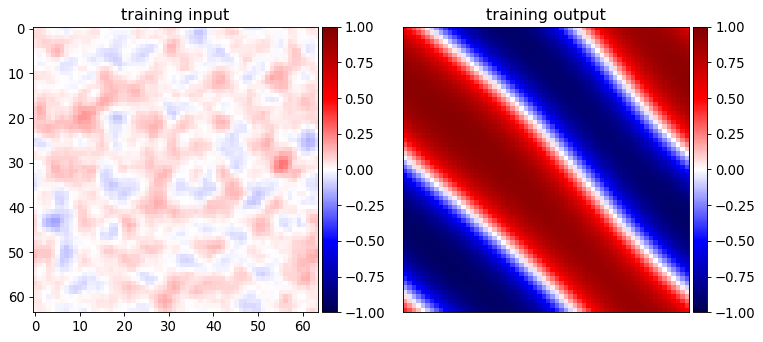

In [18]:
im_x = x_data[0]
im_y = y_data[0]
ch_utils.draw_by_side([im_x, im_y], sub_titles=["training input", "training output"])

In [19]:
transformer_x = lambda x: x[None]
transformer_y = lambda x: x[None]

dataset = CahnHillDataset(x_data, y_data, transform_x=transformer_x, transform_y=transformer_y)

item = dataset[0]
x = item["x"][None].to(device)
y = item["y"][None].to(device)

print(x.shape, y.shape)

torch.Size([1, 1, 64, 64]) torch.Size([1, 1, 64, 64])


In [20]:
from chnet.models import UNet
model = UNet(in_channels=1, out_channels=1, init_features=32).double().to(device)

item = dataset[0]
x = item["x"][None].to(device)
y = item["y"][None].to(device)
y_pred = model(x)

assert y.shape == y_pred.shape
print(mse_loss(y, y_pred).data)

tensor(0.6164, device='cuda:0', dtype=torch.float64)


# Model Training

### Training and Validation data generation

In [89]:
## Process Parameters
dim_x=96
init_steps=1
delta_sim_steps=5000
dx = 0.25 
dt = 0.01
gamma=1.0
m_l=-0.05, 
m_r=+0.05,


seed_trn = 110364
n_samples_trn = 1024
ngf = 32

device = torch.device("cuda:0")

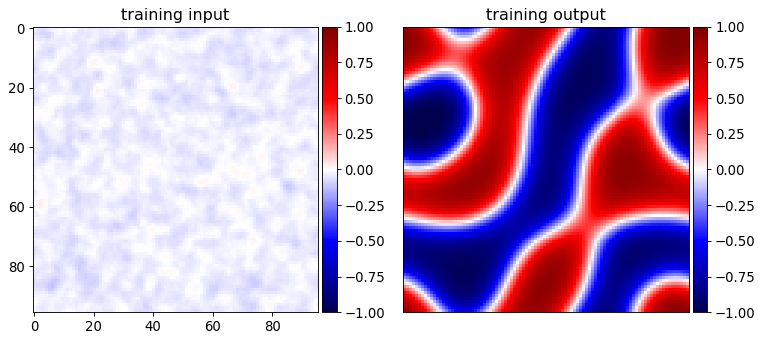

CPU times: user 978 ms, sys: 8.06 ms, total: 986 ms
Wall time: 987 ms


In [90]:
%%time
x_trn, y_trn = ch_gen.data_generator(nsamples=1, 
                              dim_x=dim_x, 
                              init_steps=init_steps, 
                              delta_sim_steps = delta_sim_steps,
                              dx=dx, 
                              dt=dt,
                              m_l=m_l, 
                              m_r=m_r,
                              n_step=1,
                              gamma=gamma, 
                              seed=2513,
                              device=device)

ch_utils.draw_by_side([x_trn[0], y_trn[0]], sub_titles=["training input", "training output"])

In [91]:
from chnet.models import UNet
model = UNet(in_channels=1, out_channels=1, init_features=ngf).double().to(device)

trn_losses = []
val_losses = []

In [92]:
criterion = mse_loss(scale=10000)
learning_rate = 1.0e-5
optimizer = torch.optim.Adam(model.parameters(), lr=learning_rate)

num_epochs = 5
primes = get_primes(1000)[:100]

print("No. of datasets: {}".format(len(primes)))

for num, prime in enumerate(primes):
    # Loss and optimizer
    x_trn, y_trn = ch_gen.data_generator(nsamples=n_samples_trn, 
                                  dim_x=dim_x, 
                                  init_steps=init_steps, 
                                  delta_sim_steps = delta_sim_steps,
                                  dx=dx, 
                                  dt=dt,
                                  m_l=m_l, 
                                  m_r=m_r,
                                  n_step=1,
                                  gamma=gamma, 
                                  seed=2513*prime,
                                  device = device)


    trn_dataset = CahnHillDataset(x_trn, y_trn, transform_x=lambda x: x[None], transform_y=lambda x: x[None])
    trn_loader = DataLoader(trn_dataset, batch_size=8, shuffle=True, num_workers=4)
    
    print("Training Run: {}, prime: {}".format(num, prime))
    
    total_step = len(trn_loader)
    
    for epoch in range(num_epochs):  
        torch.save(model.state_dict(), "out/unet_pytorch_ch{}_{}_{}_dim{}_solo.pt".format(ngf, 
                                                                                          init_steps, 
                                                                                          delta_sim_steps, 
                                                                                          dim_x))
        for i, item_trn in enumerate(tqdm.tqdm_notebook(trn_loader)):

            model.train()

            x = item_trn['x'].to(device)
            y_tru = item_trn['y'].to(device)

            # Forward pass
            y_prd = model(x)
            loss = criterion(y_tru, y_prd)

            # Backward and optimize
            optimizer.zero_grad()
            loss.backward()
            optimizer.step()

            trn_losses.append(np.sqrt(loss.item()))

            if (i) % 100 == 0:
                print ('Epoch [{}/{}], Step [{}/{}], Training Loss: {:.11f}'.format(epoch+1, 
                                                                                     num_epochs, 
                                                                                     i+1, 
                                                                                     total_step, 
                                                                                     np.mean(trn_losses[-16:])))

No. of datasets: 100
Training Run: 0, prime: 2


Epoch [1/5], Step [1/128], Training Loss: 78.52204990246
Epoch [1/5], Step [101/128], Training Loss: 68.81583223222



Epoch [2/5], Step [1/128], Training Loss: 66.03898079294
Epoch [2/5], Step [101/128], Training Loss: 40.92325586637



Epoch [3/5], Step [1/128], Training Loss: 37.48227577301
Epoch [3/5], Step [101/128], Training Loss: 30.84931062685



Epoch [4/5], Step [1/128], Training Loss: 31.01920104099
Epoch [4/5], Step [101/128], Training Loss: 27.42911255695



Epoch [5/5], Step [1/128], Training Loss: 28.08798325354
Epoch [5/5], Step [101/128], Training Loss: 25.59403085645

Training Run: 1, prime: 3


Epoch [1/5], Step [1/128], Training Loss: 26.65859887022
Epoch [1/5], Step [101/128], Training Loss: 27.64124158868



Epoch [2/5], Step [1/128], Training Loss: 28.20897115244
Epoch [2/5], Step [101/128], Training Loss: 25.80768077020



Epoch [3/5], Step [1/128], Training Loss: 25.70548095785
Epoch [3/5], Step [101/128], Training Loss: 24.26523535303



Epoch [4/5], Step [1/128], Training Loss: 24.05774212394
Epoch [4/5], Step [101/128], Training Loss: 22.72028666250



Epoch [5/5], Step [1/128], Training Loss: 22.72144660421
Epoch [5/5], Step [101/128], Training Loss: 21.34543430231

Training Run: 2, prime: 5


Epoch [1/5], Step [1/128], Training Loss: 22.35077366994
Epoch [1/5], Step [101/128], Training Loss: 24.73362747422



Epoch [2/5], Step [1/128], Training Loss: 24.53086736330
Epoch [2/5], Step [101/128], Training Loss: 23.20365785474



Epoch [3/5], Step [1/128], Training Loss: 22.37323422310
Epoch [3/5], Step [101/128], Training Loss: 21.61539871489



Epoch [4/5], Step [1/128], Training Loss: 21.43028466138
Epoch [4/5], Step [101/128], Training Loss: 20.27682336934



Epoch [5/5], Step [1/128], Training Loss: 21.13886983412
Epoch [5/5], Step [101/128], Training Loss: 19.14204433679

Training Run: 3, prime: 7


Epoch [1/5], Step [1/128], Training Loss: 19.41157358463
Epoch [1/5], Step [101/128], Training Loss: 22.30462244184



Epoch [2/5], Step [1/128], Training Loss: 22.39182355368
Epoch [2/5], Step [101/128], Training Loss: 20.13974117741



Epoch [3/5], Step [1/128], Training Loss: 20.40481119474
Epoch [3/5], Step [101/128], Training Loss: 20.40190266863



Epoch [4/5], Step [1/128], Training Loss: 19.34288474585
Epoch [4/5], Step [101/128], Training Loss: 17.77684850794



Epoch [5/5], Step [1/128], Training Loss: 18.49528327814
Epoch [5/5], Step [101/128], Training Loss: 17.11953454644

Training Run: 4, prime: 11


Epoch [1/5], Step [1/128], Training Loss: 17.46358328241
Epoch [1/5], Step [101/128], Training Loss: 22.00902479431



Epoch [2/5], Step [1/128], Training Loss: 20.07165989920
Epoch [2/5], Step [101/128], Training Loss: 19.61609993124



Epoch [3/5], Step [1/128], Training Loss: 18.63213882132
Epoch [3/5], Step [101/128], Training Loss: 18.38775532001



Epoch [4/5], Step [1/128], Training Loss: 17.36238877526
Epoch [4/5], Step [101/128], Training Loss: 16.40568125594



Epoch [5/5], Step [1/128], Training Loss: 16.04976431095
Epoch [5/5], Step [101/128], Training Loss: 14.94175223221

Training Run: 5, prime: 13


Epoch [1/5], Step [1/128], Training Loss: 15.45188141353
Epoch [1/5], Step [101/128], Training Loss: 19.99750633366



Epoch [2/5], Step [1/128], Training Loss: 18.72903233715
Epoch [2/5], Step [101/128], Training Loss: 18.12161631429



Epoch [3/5], Step [1/128], Training Loss: 17.57405199693
Epoch [3/5], Step [101/128], Training Loss: 15.70788076642



Epoch [4/5], Step [1/128], Training Loss: 15.56212770219
Epoch [4/5], Step [101/128], Training Loss: 15.15432566562



Epoch [5/5], Step [1/128], Training Loss: 14.86694569107
Epoch [5/5], Step [101/128], Training Loss: 13.51523347458

Training Run: 6, prime: 17


Epoch [1/5], Step [1/128], Training Loss: 14.52235416919
Epoch [1/5], Step [101/128], Training Loss: 18.87186336500



Epoch [2/5], Step [1/128], Training Loss: 18.52528048021
Epoch [2/5], Step [101/128], Training Loss: 16.12189097794



Epoch [3/5], Step [1/128], Training Loss: 16.64290734666
Epoch [3/5], Step [101/128], Training Loss: 15.25067671541



Epoch [4/5], Step [1/128], Training Loss: 15.70459378391
Epoch [4/5], Step [101/128], Training Loss: 14.43625740345



Epoch [5/5], Step [1/128], Training Loss: 14.25712091733
Epoch [5/5], Step [101/128], Training Loss: 13.13824070484

Training Run: 7, prime: 19


Epoch [1/5], Step [1/128], Training Loss: 13.48187674373
Epoch [1/5], Step [101/128], Training Loss: 17.76293727607



Epoch [2/5], Step [1/128], Training Loss: 17.48818733561
Epoch [2/5], Step [101/128], Training Loss: 16.76921128980



Epoch [3/5], Step [1/128], Training Loss: 15.42064238484
Epoch [3/5], Step [101/128], Training Loss: 13.75872112166



Epoch [4/5], Step [1/128], Training Loss: 14.67244318294
Epoch [4/5], Step [101/128], Training Loss: 13.66791908392



Epoch [5/5], Step [1/128], Training Loss: 13.59029334114
Epoch [5/5], Step [101/128], Training Loss: 12.61918301441

Training Run: 8, prime: 23


Epoch [1/5], Step [1/128], Training Loss: 12.92297264778
Epoch [1/5], Step [101/128], Training Loss: 17.80102722337



Epoch [2/5], Step [1/128], Training Loss: 17.40594680815
Epoch [2/5], Step [101/128], Training Loss: 15.56510221286



Epoch [3/5], Step [1/128], Training Loss: 14.36861427832
Epoch [3/5], Step [101/128], Training Loss: 14.06176510669



Epoch [4/5], Step [1/128], Training Loss: 14.19707227199
Epoch [4/5], Step [101/128], Training Loss: 13.03187025235



Epoch [5/5], Step [1/128], Training Loss: 12.82587921653
Epoch [5/5], Step [101/128], Training Loss: 12.00587488544

Training Run: 9, prime: 29


Epoch [1/5], Step [1/128], Training Loss: 12.17664318572
Epoch [1/5], Step [101/128], Training Loss: 15.63506472928



Epoch [2/5], Step [1/128], Training Loss: 15.82552168909
Epoch [2/5], Step [101/128], Training Loss: 14.31578928817



Epoch [3/5], Step [1/128], Training Loss: 13.94712193883
Epoch [3/5], Step [101/128], Training Loss: 12.69829326012



Epoch [4/5], Step [1/128], Training Loss: 13.06162771056
Epoch [4/5], Step [101/128], Training Loss: 12.44580852248



Epoch [5/5], Step [1/128], Training Loss: 12.31214367775
Epoch [5/5], Step [101/128], Training Loss: 11.82048814779

Training Run: 10, prime: 31


Epoch [1/5], Step [1/128], Training Loss: 11.60641275363
Epoch [1/5], Step [101/128], Training Loss: 15.66811011776



Epoch [2/5], Step [1/128], Training Loss: 14.97215344920
Epoch [2/5], Step [101/128], Training Loss: 14.37672265503



Epoch [3/5], Step [1/128], Training Loss: 13.84532584480
Epoch [3/5], Step [101/128], Training Loss: 12.63738110216



Epoch [4/5], Step [1/128], Training Loss: 12.56208007934
Epoch [4/5], Step [101/128], Training Loss: 12.15227935975



Epoch [5/5], Step [1/128], Training Loss: 12.01137725357
Epoch [5/5], Step [101/128], Training Loss: 11.32707670025

Training Run: 11, prime: 37


Epoch [1/5], Step [1/128], Training Loss: 11.63162333441
Epoch [1/5], Step [101/128], Training Loss: 14.37418250994



Epoch [2/5], Step [1/128], Training Loss: 15.76838370200
Epoch [2/5], Step [101/128], Training Loss: 13.26843882556



Epoch [3/5], Step [1/128], Training Loss: 13.80100978335
Epoch [3/5], Step [101/128], Training Loss: 12.94430222973



Epoch [4/5], Step [1/128], Training Loss: 12.57726579654
Epoch [4/5], Step [101/128], Training Loss: 11.36026410556



Epoch [5/5], Step [1/128], Training Loss: 11.02139515933
Epoch [5/5], Step [101/128], Training Loss: 10.91154137888

Training Run: 12, prime: 41


Epoch [1/5], Step [1/128], Training Loss: 11.32670339685
Epoch [1/5], Step [101/128], Training Loss: 14.33453190049



Epoch [2/5], Step [1/128], Training Loss: 14.61061653358
Epoch [2/5], Step [101/128], Training Loss: 13.03788935947



Epoch [3/5], Step [1/128], Training Loss: 12.92652543522
Epoch [3/5], Step [101/128], Training Loss: 11.61425062325



Epoch [4/5], Step [1/128], Training Loss: 11.74641687395
Epoch [4/5], Step [101/128], Training Loss: 10.69156432811



Epoch [5/5], Step [1/128], Training Loss: 10.79150476600
Epoch [5/5], Step [101/128], Training Loss: 10.95734339836

Training Run: 13, prime: 43


Epoch [1/5], Step [1/128], Training Loss: 10.78450725546
Epoch [1/5], Step [101/128], Training Loss: 14.52497619905



Epoch [2/5], Step [1/128], Training Loss: 13.58394041489
Epoch [2/5], Step [101/128], Training Loss: 13.21720504552



Epoch [3/5], Step [1/128], Training Loss: 12.74051046405
Epoch [3/5], Step [101/128], Training Loss: 11.73172700192



Epoch [4/5], Step [1/128], Training Loss: 11.59071788524
Epoch [4/5], Step [101/128], Training Loss: 10.95011577999



Epoch [5/5], Step [1/128], Training Loss: 11.07407494426
Epoch [5/5], Step [101/128], Training Loss: 10.64814480759

Training Run: 14, prime: 47


Epoch [1/5], Step [1/128], Training Loss: 10.34851399260
Epoch [1/5], Step [101/128], Training Loss: 13.05718396124



Epoch [2/5], Step [1/128], Training Loss: 12.98583935266
Epoch [2/5], Step [101/128], Training Loss: 12.73937968282



Epoch [3/5], Step [1/128], Training Loss: 11.45063724906
Epoch [3/5], Step [101/128], Training Loss: 10.98765074106



Epoch [4/5], Step [1/128], Training Loss: 11.22473319971
Epoch [4/5], Step [101/128], Training Loss: 10.10826064617



Epoch [5/5], Step [1/128], Training Loss: 9.94517664879
Epoch [5/5], Step [101/128], Training Loss: 9.57417010335

Training Run: 15, prime: 53


Epoch [1/5], Step [1/128], Training Loss: 10.43744444402
Epoch [1/5], Step [101/128], Training Loss: 12.49442939669



Epoch [2/5], Step [1/128], Training Loss: 13.01338456246
Epoch [2/5], Step [101/128], Training Loss: 11.47484061765



Epoch [3/5], Step [1/128], Training Loss: 11.46621173254
Epoch [3/5], Step [101/128], Training Loss: 10.83506231180



Epoch [4/5], Step [1/128], Training Loss: 10.78693259630
Epoch [4/5], Step [101/128], Training Loss: 9.71924251438



Epoch [5/5], Step [1/128], Training Loss: 10.12559912963
Epoch [5/5], Step [101/128], Training Loss: 9.64194200931

Training Run: 16, prime: 59


Epoch [1/5], Step [1/128], Training Loss: 9.94546409194
Epoch [1/5], Step [101/128], Training Loss: 13.12544945477



Epoch [2/5], Step [1/128], Training Loss: 13.06907785587
Epoch [2/5], Step [101/128], Training Loss: 11.75416269512



Epoch [3/5], Step [1/128], Training Loss: 11.29310284362
Epoch [3/5], Step [101/128], Training Loss: 10.28436915698



Epoch [4/5], Step [1/128], Training Loss: 10.51018233373
Epoch [4/5], Step [101/128], Training Loss: 10.11646367150



Epoch [5/5], Step [1/128], Training Loss: 10.14429680076
Epoch [5/5], Step [101/128], Training Loss: 9.44053792624

Training Run: 17, prime: 61


Epoch [1/5], Step [1/128], Training Loss: 9.32653282606
Epoch [1/5], Step [101/128], Training Loss: 12.32826309869



Epoch [2/5], Step [1/128], Training Loss: 12.31784793404
Epoch [2/5], Step [101/128], Training Loss: 11.37143811842



Epoch [3/5], Step [1/128], Training Loss: 10.78998427025
Epoch [3/5], Step [101/128], Training Loss: 10.28510045662



Epoch [4/5], Step [1/128], Training Loss: 10.18484882380
Epoch [4/5], Step [101/128], Training Loss: 10.72986450049



Epoch [5/5], Step [1/128], Training Loss: 10.55510304493
Epoch [5/5], Step [101/128], Training Loss: 9.66543777069

Training Run: 18, prime: 67


Epoch [1/5], Step [1/128], Training Loss: 9.38355742804
Epoch [1/5], Step [101/128], Training Loss: 12.91920137531



Epoch [2/5], Step [1/128], Training Loss: 12.49849967720
Epoch [2/5], Step [101/128], Training Loss: 11.19619316409



Epoch [3/5], Step [1/128], Training Loss: 10.40588348534
Epoch [3/5], Step [101/128], Training Loss: 9.57999384975



Epoch [4/5], Step [1/128], Training Loss: 10.20350607365
Epoch [4/5], Step [101/128], Training Loss: 9.44766215179



Epoch [5/5], Step [1/128], Training Loss: 9.67909325052
Epoch [5/5], Step [101/128], Training Loss: 8.58551641011

Training Run: 19, prime: 71


Epoch [1/5], Step [1/128], Training Loss: 9.01783697884
Epoch [1/5], Step [101/128], Training Loss: 11.46097153201



Epoch [2/5], Step [1/128], Training Loss: 11.30232178834
Epoch [2/5], Step [101/128], Training Loss: 10.49427577749



Epoch [3/5], Step [1/128], Training Loss: 10.49024987202
Epoch [3/5], Step [101/128], Training Loss: 9.88076810274



Epoch [4/5], Step [1/128], Training Loss: 9.88751458887
Epoch [4/5], Step [101/128], Training Loss: 8.80426642173



Epoch [5/5], Step [1/128], Training Loss: 9.25345605402
Epoch [5/5], Step [101/128], Training Loss: 8.68523684693

Training Run: 20, prime: 73


Epoch [1/5], Step [1/128], Training Loss: 9.36156671190
Epoch [1/5], Step [101/128], Training Loss: 12.34754312984



Epoch [2/5], Step [1/128], Training Loss: 11.83188470325
Epoch [2/5], Step [101/128], Training Loss: 10.63108641897



Epoch [3/5], Step [1/128], Training Loss: 10.45156030750
Epoch [3/5], Step [101/128], Training Loss: 9.91859533217



Epoch [4/5], Step [1/128], Training Loss: 9.58920447855
Epoch [4/5], Step [101/128], Training Loss: 8.91479327169



Epoch [5/5], Step [1/128], Training Loss: 8.96192639537
Epoch [5/5], Step [101/128], Training Loss: 9.31353586107

Training Run: 21, prime: 79


Epoch [1/5], Step [1/128], Training Loss: 8.65000869095
Epoch [1/5], Step [101/128], Training Loss: 11.86660349043



Epoch [2/5], Step [1/128], Training Loss: 11.21772010875
Epoch [2/5], Step [101/128], Training Loss: 10.94429972081



Epoch [3/5], Step [1/128], Training Loss: 10.51000146438
Epoch [3/5], Step [101/128], Training Loss: 9.47219073251



Epoch [4/5], Step [1/128], Training Loss: 9.16334079848
Epoch [4/5], Step [101/128], Training Loss: 8.89509334689



Epoch [5/5], Step [1/128], Training Loss: 8.83349889242
Epoch [5/5], Step [101/128], Training Loss: 8.56981239600

Training Run: 22, prime: 83


Epoch [1/5], Step [1/128], Training Loss: 9.28881289576
Epoch [1/5], Step [101/128], Training Loss: 11.02387446021



Epoch [2/5], Step [1/128], Training Loss: 11.61548633633
Epoch [2/5], Step [101/128], Training Loss: 11.64462211868



Epoch [3/5], Step [1/128], Training Loss: 9.76996390364
Epoch [3/5], Step [101/128], Training Loss: 8.57294254128



Epoch [4/5], Step [1/128], Training Loss: 9.39351349721
Epoch [4/5], Step [101/128], Training Loss: 8.68116323836



Epoch [5/5], Step [1/128], Training Loss: 8.67097350534
Epoch [5/5], Step [101/128], Training Loss: 8.32911692964

Training Run: 23, prime: 89


Epoch [1/5], Step [1/128], Training Loss: 8.76333774966
Epoch [1/5], Step [101/128], Training Loss: 11.54385714661



Epoch [2/5], Step [1/128], Training Loss: 11.66713776896
Epoch [2/5], Step [101/128], Training Loss: 10.50222116206



Epoch [3/5], Step [1/128], Training Loss: 10.28682674456
Epoch [3/5], Step [101/128], Training Loss: 9.49269580988



Epoch [4/5], Step [1/128], Training Loss: 9.50897972408
Epoch [4/5], Step [101/128], Training Loss: 8.88615225708



Epoch [5/5], Step [1/128], Training Loss: 8.26315717154
Epoch [5/5], Step [101/128], Training Loss: 8.31841652448

Training Run: 24, prime: 97


Epoch [1/5], Step [1/128], Training Loss: 8.14421982551
Epoch [1/5], Step [101/128], Training Loss: 11.66799400346



Epoch [2/5], Step [1/128], Training Loss: 11.41547913254
Epoch [2/5], Step [101/128], Training Loss: 9.55028714248



Epoch [3/5], Step [1/128], Training Loss: 10.10536137268
Epoch [3/5], Step [101/128], Training Loss: 9.18691515068



Epoch [4/5], Step [1/128], Training Loss: 9.43566397757
Epoch [4/5], Step [101/128], Training Loss: 8.60666351323



Epoch [5/5], Step [1/128], Training Loss: 8.86949407894
Epoch [5/5], Step [101/128], Training Loss: 8.26131047316

Training Run: 25, prime: 101


Epoch [1/5], Step [1/128], Training Loss: 8.25599264264
Epoch [1/5], Step [101/128], Training Loss: 11.67195485968



Epoch [2/5], Step [1/128], Training Loss: 11.10886360854
Epoch [2/5], Step [101/128], Training Loss: 10.00263410058



Epoch [3/5], Step [1/128], Training Loss: 9.38687941685
Epoch [3/5], Step [101/128], Training Loss: 8.76831858154



Epoch [4/5], Step [1/128], Training Loss: 8.67196851254
Epoch [4/5], Step [101/128], Training Loss: 8.66620851948



Epoch [5/5], Step [1/128], Training Loss: 8.60918252644
Epoch [5/5], Step [101/128], Training Loss: 8.45323473690

Training Run: 26, prime: 103


Epoch [1/5], Step [1/128], Training Loss: 8.40888972113
Epoch [1/5], Step [101/128], Training Loss: 11.34507708665



Epoch [2/5], Step [1/128], Training Loss: 11.82797385220
Epoch [2/5], Step [101/128], Training Loss: 9.18549188454



Epoch [3/5], Step [1/128], Training Loss: 9.59182700755
Epoch [3/5], Step [101/128], Training Loss: 8.94760876876



Epoch [4/5], Step [1/128], Training Loss: 8.40434141131
Epoch [4/5], Step [101/128], Training Loss: 7.99915218844



Epoch [5/5], Step [1/128], Training Loss: 8.35254945337
Epoch [5/5], Step [101/128], Training Loss: 7.74462759777

Training Run: 27, prime: 107


Epoch [1/5], Step [1/128], Training Loss: 7.57875916220
Epoch [1/5], Step [101/128], Training Loss: 11.03240836012



Epoch [2/5], Step [1/128], Training Loss: 11.11305779261
Epoch [2/5], Step [101/128], Training Loss: 10.25157105863



Epoch [3/5], Step [1/128], Training Loss: 10.00391216800
Epoch [3/5], Step [101/128], Training Loss: 8.36065383252



Epoch [4/5], Step [1/128], Training Loss: 8.59486107770
Epoch [4/5], Step [101/128], Training Loss: 8.39882147813



Epoch [5/5], Step [1/128], Training Loss: 8.14721812168
Epoch [5/5], Step [101/128], Training Loss: 7.86585709361

Training Run: 28, prime: 109


Epoch [1/5], Step [1/128], Training Loss: 8.12272908588
Epoch [1/5], Step [101/128], Training Loss: 11.61342458121



Epoch [2/5], Step [1/128], Training Loss: 10.74470343455
Epoch [2/5], Step [101/128], Training Loss: 9.48381122207



Epoch [3/5], Step [1/128], Training Loss: 9.14966262357
Epoch [3/5], Step [101/128], Training Loss: 8.37769218811



Epoch [4/5], Step [1/128], Training Loss: 8.38802625970
Epoch [4/5], Step [101/128], Training Loss: 7.90089444570



Epoch [5/5], Step [1/128], Training Loss: 8.29637759944
Epoch [5/5], Step [101/128], Training Loss: 7.87370396696

Training Run: 29, prime: 113


Epoch [1/5], Step [1/128], Training Loss: 7.61969183596
Epoch [1/5], Step [101/128], Training Loss: 10.30259843648



Epoch [2/5], Step [1/128], Training Loss: 10.71492907866
Epoch [2/5], Step [101/128], Training Loss: 9.36285231227



Epoch [3/5], Step [1/128], Training Loss: 9.65398285518
Epoch [3/5], Step [101/128], Training Loss: 8.51713891334



Epoch [4/5], Step [1/128], Training Loss: 8.91091046128
Epoch [4/5], Step [101/128], Training Loss: 8.27281497347



Epoch [5/5], Step [1/128], Training Loss: 8.25836350865
Epoch [5/5], Step [101/128], Training Loss: 8.02242162891

Training Run: 30, prime: 127


Epoch [1/5], Step [1/128], Training Loss: 8.09814966634
Epoch [1/5], Step [101/128], Training Loss: 10.08785845961



Epoch [2/5], Step [1/128], Training Loss: 10.26908746164
Epoch [2/5], Step [101/128], Training Loss: 8.38278159463



Epoch [3/5], Step [1/128], Training Loss: 8.52937132922
Epoch [3/5], Step [101/128], Training Loss: 8.14892639429



Epoch [4/5], Step [1/128], Training Loss: 8.03881559385
Epoch [4/5], Step [101/128], Training Loss: 7.78243493075



Epoch [5/5], Step [1/128], Training Loss: 7.99121724321
Epoch [5/5], Step [101/128], Training Loss: 7.18497818266

Training Run: 31, prime: 131


Epoch [1/5], Step [1/128], Training Loss: 7.43227552128
Epoch [1/5], Step [101/128], Training Loss: 10.26845922352



Epoch [2/5], Step [1/128], Training Loss: 10.15908205711
Epoch [2/5], Step [101/128], Training Loss: 9.12169020653



Epoch [3/5], Step [1/128], Training Loss: 8.88925734907
Epoch [3/5], Step [101/128], Training Loss: 8.13778121310



Epoch [4/5], Step [1/128], Training Loss: 8.22346017041
Epoch [4/5], Step [101/128], Training Loss: 7.48982661073



Epoch [5/5], Step [1/128], Training Loss: 7.51218017095
Epoch [5/5], Step [101/128], Training Loss: 7.45751207892

Training Run: 32, prime: 137


Epoch [1/5], Step [1/128], Training Loss: 7.37381903296
Epoch [1/5], Step [101/128], Training Loss: 11.55571984088



Epoch [2/5], Step [1/128], Training Loss: 10.37698549181
Epoch [2/5], Step [101/128], Training Loss: 8.48452402884



Epoch [3/5], Step [1/128], Training Loss: 8.37874771474
Epoch [3/5], Step [101/128], Training Loss: 8.50306454736



Epoch [4/5], Step [1/128], Training Loss: 8.14602859539
Epoch [4/5], Step [101/128], Training Loss: 7.87864069423



Epoch [5/5], Step [1/128], Training Loss: 7.91564034602
Epoch [5/5], Step [101/128], Training Loss: 7.53009343936

Training Run: 33, prime: 139


Epoch [1/5], Step [1/128], Training Loss: 7.52869036679
Epoch [1/5], Step [101/128], Training Loss: 9.72497528179



Epoch [2/5], Step [1/128], Training Loss: 9.81842021415
Epoch [2/5], Step [101/128], Training Loss: 8.71170798952



Epoch [3/5], Step [1/128], Training Loss: 8.69099092641
Epoch [3/5], Step [101/128], Training Loss: 7.97825125549



Epoch [4/5], Step [1/128], Training Loss: 7.95845084201
Epoch [4/5], Step [101/128], Training Loss: 8.26242836322



Epoch [5/5], Step [1/128], Training Loss: 7.55969596967
Epoch [5/5], Step [101/128], Training Loss: 6.56384326599

Training Run: 34, prime: 149


Epoch [1/5], Step [1/128], Training Loss: 7.45612270227
Epoch [1/5], Step [101/128], Training Loss: 8.85228495462



Epoch [2/5], Step [1/128], Training Loss: 10.67397318437
Epoch [2/5], Step [101/128], Training Loss: 7.82176722759



Epoch [3/5], Step [1/128], Training Loss: 8.85141493789
Epoch [3/5], Step [101/128], Training Loss: 7.89448419300



Epoch [4/5], Step [1/128], Training Loss: 7.87547422117
Epoch [4/5], Step [101/128], Training Loss: 7.48724929206



Epoch [5/5], Step [1/128], Training Loss: 7.30255940819
Epoch [5/5], Step [101/128], Training Loss: 7.18582861631

Training Run: 35, prime: 151


Epoch [1/5], Step [1/128], Training Loss: 6.73447162291
Epoch [1/5], Step [101/128], Training Loss: 10.05871549050



Epoch [2/5], Step [1/128], Training Loss: 9.68815451859
Epoch [2/5], Step [101/128], Training Loss: 8.21990022758



Epoch [3/5], Step [1/128], Training Loss: 9.04521648100
Epoch [3/5], Step [101/128], Training Loss: 7.79512159692



Epoch [4/5], Step [1/128], Training Loss: 7.85304887030
Epoch [4/5], Step [101/128], Training Loss: 7.18637912052



Epoch [5/5], Step [1/128], Training Loss: 7.69061971560
Epoch [5/5], Step [101/128], Training Loss: 7.07656105366

Training Run: 36, prime: 157


Epoch [1/5], Step [1/128], Training Loss: 6.99181659663
Epoch [1/5], Step [101/128], Training Loss: 10.17717368152



Epoch [2/5], Step [1/128], Training Loss: 9.97364386744
Epoch [2/5], Step [101/128], Training Loss: 8.35238017538



Epoch [3/5], Step [1/128], Training Loss: 8.50648097336
Epoch [3/5], Step [101/128], Training Loss: 7.54786359466



Epoch [4/5], Step [1/128], Training Loss: 7.36290351482
Epoch [4/5], Step [101/128], Training Loss: 7.65151537595



Epoch [5/5], Step [1/128], Training Loss: 7.57446401798
Epoch [5/5], Step [101/128], Training Loss: 6.42195302108

Training Run: 37, prime: 163


Epoch [1/5], Step [1/128], Training Loss: 6.89262527176
Epoch [1/5], Step [101/128], Training Loss: 9.63696933695



Epoch [2/5], Step [1/128], Training Loss: 9.38108590176
Epoch [2/5], Step [101/128], Training Loss: 8.57208441324



Epoch [3/5], Step [1/128], Training Loss: 8.35051568500
Epoch [3/5], Step [101/128], Training Loss: 7.28102048392



Epoch [4/5], Step [1/128], Training Loss: 7.36079041699
Epoch [4/5], Step [101/128], Training Loss: 7.30285504935



Epoch [5/5], Step [1/128], Training Loss: 7.04505184189
Epoch [5/5], Step [101/128], Training Loss: 6.80875434604

Training Run: 38, prime: 167


Epoch [1/5], Step [1/128], Training Loss: 7.45253633800
Epoch [1/5], Step [101/128], Training Loss: 10.17210448917



Epoch [2/5], Step [1/128], Training Loss: 9.69014088039
Epoch [2/5], Step [101/128], Training Loss: 8.43610905460



Epoch [3/5], Step [1/128], Training Loss: 8.70026974221
Epoch [3/5], Step [101/128], Training Loss: 7.75863489757



Epoch [4/5], Step [1/128], Training Loss: 7.57521724766
Epoch [4/5], Step [101/128], Training Loss: 7.00171862891



Epoch [5/5], Step [1/128], Training Loss: 6.80395604328
Epoch [5/5], Step [101/128], Training Loss: 6.88253749354

Training Run: 39, prime: 173


Epoch [1/5], Step [1/128], Training Loss: 6.82088399225
Epoch [1/5], Step [101/128], Training Loss: 9.26673746596



Epoch [2/5], Step [1/128], Training Loss: 8.72496263464
Epoch [2/5], Step [101/128], Training Loss: 7.94186677951



Epoch [3/5], Step [1/128], Training Loss: 8.05633832849
Epoch [3/5], Step [101/128], Training Loss: 7.65319021631



Epoch [4/5], Step [1/128], Training Loss: 8.06903523405
Epoch [4/5], Step [101/128], Training Loss: 6.80591393389



Epoch [5/5], Step [1/128], Training Loss: 6.97441999579
Epoch [5/5], Step [101/128], Training Loss: 7.05109155923

Training Run: 40, prime: 179


Epoch [1/5], Step [1/128], Training Loss: 6.36983723516
Epoch [1/5], Step [101/128], Training Loss: 9.38639832332



Epoch [2/5], Step [1/128], Training Loss: 9.67513720992
Epoch [2/5], Step [101/128], Training Loss: 7.58915043444



Epoch [3/5], Step [1/128], Training Loss: 8.05755333941
Epoch [3/5], Step [101/128], Training Loss: 6.96018988089



Epoch [4/5], Step [1/128], Training Loss: 7.49234654438
Epoch [4/5], Step [101/128], Training Loss: 7.14863654637



Epoch [5/5], Step [1/128], Training Loss: 6.73803912717
Epoch [5/5], Step [101/128], Training Loss: 6.82785056019

Training Run: 41, prime: 181


Epoch [1/5], Step [1/128], Training Loss: 6.77110936269
Epoch [1/5], Step [101/128], Training Loss: 10.13615305693



Epoch [2/5], Step [1/128], Training Loss: 9.22202049662
Epoch [2/5], Step [101/128], Training Loss: 7.94740103513



Epoch [3/5], Step [1/128], Training Loss: 8.12139714482
Epoch [3/5], Step [101/128], Training Loss: 7.49183523300



Epoch [4/5], Step [1/128], Training Loss: 7.78930020362
Epoch [4/5], Step [101/128], Training Loss: 6.47400471799



Epoch [5/5], Step [1/128], Training Loss: 7.42032629503
Epoch [5/5], Step [101/128], Training Loss: 6.66051500628

Training Run: 42, prime: 191


Epoch [1/5], Step [1/128], Training Loss: 6.79888327811
Epoch [1/5], Step [101/128], Training Loss: 9.81816623360



Epoch [2/5], Step [1/128], Training Loss: 8.84513323317
Epoch [2/5], Step [101/128], Training Loss: 7.89569148852



Epoch [3/5], Step [1/128], Training Loss: 7.83725139882
Epoch [3/5], Step [101/128], Training Loss: 6.92976311537



Epoch [4/5], Step [1/128], Training Loss: 7.22032602920
Epoch [4/5], Step [101/128], Training Loss: 7.39273013242



Epoch [5/5], Step [1/128], Training Loss: 7.20676245754
Epoch [5/5], Step [101/128], Training Loss: 6.54701731646

Training Run: 43, prime: 193


Epoch [1/5], Step [1/128], Training Loss: 7.27678170760
Epoch [1/5], Step [101/128], Training Loss: 8.93335653676



Epoch [2/5], Step [1/128], Training Loss: 9.23405566401
Epoch [2/5], Step [101/128], Training Loss: 7.99852684864



Epoch [3/5], Step [1/128], Training Loss: 8.41794503490
Epoch [3/5], Step [101/128], Training Loss: 6.81228579594



Epoch [4/5], Step [1/128], Training Loss: 7.26349508696
Epoch [4/5], Step [101/128], Training Loss: 6.94412457126



Epoch [5/5], Step [1/128], Training Loss: 6.82046707466
Epoch [5/5], Step [101/128], Training Loss: 6.43179031555

Training Run: 44, prime: 197


Epoch [1/5], Step [1/128], Training Loss: 6.70418777302
Epoch [1/5], Step [101/128], Training Loss: 9.15239338415



Epoch [2/5], Step [1/128], Training Loss: 9.25074062856
Epoch [2/5], Step [101/128], Training Loss: 7.46676498612



Epoch [3/5], Step [1/128], Training Loss: 7.81227599089
Epoch [3/5], Step [101/128], Training Loss: 7.72846001907



Epoch [4/5], Step [1/128], Training Loss: 7.08078582286
Epoch [4/5], Step [101/128], Training Loss: 7.02897130589



Epoch [5/5], Step [1/128], Training Loss: 6.94457530356
Epoch [5/5], Step [101/128], Training Loss: 6.86290024446

Training Run: 45, prime: 199


Epoch [1/5], Step [1/128], Training Loss: 6.79810020557
Epoch [1/5], Step [101/128], Training Loss: 8.75905805396



Epoch [2/5], Step [1/128], Training Loss: 8.89108922976
Epoch [2/5], Step [101/128], Training Loss: 7.78371971281



Epoch [3/5], Step [1/128], Training Loss: 8.05284878371
Epoch [3/5], Step [101/128], Training Loss: 7.05980131895



Epoch [4/5], Step [1/128], Training Loss: 7.24319835497
Epoch [4/5], Step [101/128], Training Loss: 6.78840419232



Epoch [5/5], Step [1/128], Training Loss: 7.18993236240
Epoch [5/5], Step [101/128], Training Loss: 6.64691315528

Training Run: 46, prime: 211


Epoch [1/5], Step [1/128], Training Loss: 6.10764575514
Epoch [1/5], Step [101/128], Training Loss: 8.73354689258



Epoch [2/5], Step [1/128], Training Loss: 8.29378480673
Epoch [2/5], Step [101/128], Training Loss: 7.54730801030



Epoch [3/5], Step [1/128], Training Loss: 7.29653669250
Epoch [3/5], Step [101/128], Training Loss: 6.59891162263



Epoch [4/5], Step [1/128], Training Loss: 7.38425062939
Epoch [4/5], Step [101/128], Training Loss: 6.64109628645



Epoch [5/5], Step [1/128], Training Loss: 6.65515954240
Epoch [5/5], Step [101/128], Training Loss: 6.73500047275

Training Run: 47, prime: 223


Epoch [1/5], Step [1/128], Training Loss: 6.84985011973
Epoch [1/5], Step [101/128], Training Loss: 8.49756705747



Epoch [2/5], Step [1/128], Training Loss: 9.12064222293
Epoch [2/5], Step [101/128], Training Loss: 7.93995598059



Epoch [3/5], Step [1/128], Training Loss: 7.52586411481
Epoch [3/5], Step [101/128], Training Loss: 6.97136309728



Epoch [4/5], Step [1/128], Training Loss: 7.07191909565
Epoch [4/5], Step [101/128], Training Loss: 6.84289024176



Epoch [5/5], Step [1/128], Training Loss: 6.36896094636
Epoch [5/5], Step [101/128], Training Loss: 6.46420269603

Training Run: 48, prime: 227


Epoch [1/5], Step [1/128], Training Loss: 6.61535694653
Epoch [1/5], Step [101/128], Training Loss: 8.87961181910



Epoch [2/5], Step [1/128], Training Loss: 8.49100889829
Epoch [2/5], Step [101/128], Training Loss: 7.40638732737



Epoch [3/5], Step [1/128], Training Loss: 7.71751662242
Epoch [3/5], Step [101/128], Training Loss: 7.07630911182



Epoch [4/5], Step [1/128], Training Loss: 6.55147573953
Epoch [4/5], Step [101/128], Training Loss: 6.70660067813



Epoch [5/5], Step [1/128], Training Loss: 6.51612588452
Epoch [5/5], Step [101/128], Training Loss: 6.35913875855

Training Run: 49, prime: 229


Epoch [1/5], Step [1/128], Training Loss: 7.89641111019
Epoch [1/5], Step [101/128], Training Loss: 8.72837508415



Epoch [2/5], Step [1/128], Training Loss: 8.90669295251
Epoch [2/5], Step [101/128], Training Loss: 7.69143051776



Epoch [3/5], Step [1/128], Training Loss: 8.50804160557
Epoch [3/5], Step [101/128], Training Loss: 7.50469085524



Epoch [4/5], Step [1/128], Training Loss: 7.06614622062
Epoch [4/5], Step [101/128], Training Loss: 6.97560865497



Epoch [5/5], Step [1/128], Training Loss: 6.58535053975
Epoch [5/5], Step [101/128], Training Loss: 6.41912023464

Training Run: 50, prime: 233


Epoch [1/5], Step [1/128], Training Loss: 6.86171028515
Epoch [1/5], Step [101/128], Training Loss: 8.75838942736



Epoch [2/5], Step [1/128], Training Loss: 8.43337661938
Epoch [2/5], Step [101/128], Training Loss: 7.66525321452



Epoch [3/5], Step [1/128], Training Loss: 7.31333660155
Epoch [3/5], Step [101/128], Training Loss: 7.33252013053



Epoch [4/5], Step [1/128], Training Loss: 7.10094859109
Epoch [4/5], Step [101/128], Training Loss: 6.56874854383



Epoch [5/5], Step [1/128], Training Loss: 6.51612572813
Epoch [5/5], Step [101/128], Training Loss: 6.31368464352

Training Run: 51, prime: 239


Epoch [1/5], Step [1/128], Training Loss: 7.06262432511
Epoch [1/5], Step [101/128], Training Loss: 9.69768373805



Epoch [2/5], Step [1/128], Training Loss: 8.06572786343
Epoch [2/5], Step [101/128], Training Loss: 7.79054060598



Epoch [3/5], Step [1/128], Training Loss: 7.66231686362
Epoch [3/5], Step [101/128], Training Loss: 6.75003077199



Epoch [4/5], Step [1/128], Training Loss: 7.06609472978
Epoch [4/5], Step [101/128], Training Loss: 6.41104325327



Epoch [5/5], Step [1/128], Training Loss: 6.82401609018
Epoch [5/5], Step [101/128], Training Loss: 6.06634420560

Training Run: 52, prime: 241


Epoch [1/5], Step [1/128], Training Loss: 6.80375206222
Epoch [1/5], Step [101/128], Training Loss: 9.12063392704



Epoch [2/5], Step [1/128], Training Loss: 9.08273704118
Epoch [2/5], Step [101/128], Training Loss: 8.81334436618



Epoch [3/5], Step [1/128], Training Loss: 7.28321796559
Epoch [3/5], Step [101/128], Training Loss: 7.05231595488



Epoch [4/5], Step [1/128], Training Loss: 7.15052017940
Epoch [4/5], Step [101/128], Training Loss: 6.73302109863



Epoch [5/5], Step [1/128], Training Loss: 6.25616550407
Epoch [5/5], Step [101/128], Training Loss: 6.19624739022

Training Run: 53, prime: 251


Epoch [1/5], Step [1/128], Training Loss: 6.21451513868
Epoch [1/5], Step [101/128], Training Loss: 8.04194110386



Epoch [2/5], Step [1/128], Training Loss: 8.74603794708
Epoch [2/5], Step [101/128], Training Loss: 7.53461815554



Epoch [3/5], Step [1/128], Training Loss: 7.77677173887
Epoch [3/5], Step [101/128], Training Loss: 6.88516038258



Epoch [4/5], Step [1/128], Training Loss: 6.70955242572
Epoch [4/5], Step [101/128], Training Loss: 6.24867990804



Epoch [5/5], Step [1/128], Training Loss: 6.23793201972
Epoch [5/5], Step [101/128], Training Loss: 5.88329198696

Training Run: 54, prime: 257


Epoch [1/5], Step [1/128], Training Loss: 6.57464105319
Epoch [1/5], Step [101/128], Training Loss: 8.81377081632



Epoch [2/5], Step [1/128], Training Loss: 9.43343540248
Epoch [2/5], Step [101/128], Training Loss: 7.42067222477



Epoch [3/5], Step [1/128], Training Loss: 7.59537035925
Epoch [3/5], Step [101/128], Training Loss: 6.74956486201



Epoch [4/5], Step [1/128], Training Loss: 7.53109486040
Epoch [4/5], Step [101/128], Training Loss: 6.39711183259



Epoch [5/5], Step [1/128], Training Loss: 6.63882876945
Epoch [5/5], Step [101/128], Training Loss: 6.15153569206

Training Run: 55, prime: 263


Epoch [1/5], Step [1/128], Training Loss: 6.32403606810
Epoch [1/5], Step [101/128], Training Loss: 8.35162935586



Epoch [2/5], Step [1/128], Training Loss: 8.63738806454
Epoch [2/5], Step [101/128], Training Loss: 7.34655469997



Epoch [3/5], Step [1/128], Training Loss: 7.18501177413
Epoch [3/5], Step [101/128], Training Loss: 6.85557594699



Epoch [4/5], Step [1/128], Training Loss: 6.81659081763
Epoch [4/5], Step [101/128], Training Loss: 5.81146185678



Epoch [5/5], Step [1/128], Training Loss: 6.04231480308
Epoch [5/5], Step [101/128], Training Loss: 5.96447661937

Training Run: 56, prime: 269


Epoch [1/5], Step [1/128], Training Loss: 5.69556746058
Epoch [1/5], Step [101/128], Training Loss: 8.53402954270



Epoch [2/5], Step [1/128], Training Loss: 8.90850165940
Epoch [2/5], Step [101/128], Training Loss: 7.17436846665



Epoch [3/5], Step [1/128], Training Loss: 7.35978644892
Epoch [3/5], Step [101/128], Training Loss: 6.61348215906



Epoch [4/5], Step [1/128], Training Loss: 7.42110577682
Epoch [4/5], Step [101/128], Training Loss: 6.39116533931



Epoch [5/5], Step [1/128], Training Loss: 6.08962722143
Epoch [5/5], Step [101/128], Training Loss: 5.88623238634

Training Run: 57, prime: 271


Epoch [1/5], Step [1/128], Training Loss: 5.96985815846
Epoch [1/5], Step [101/128], Training Loss: 9.12706894062



Epoch [2/5], Step [1/128], Training Loss: 8.19361680717
Epoch [2/5], Step [101/128], Training Loss: 6.73468526147



Epoch [3/5], Step [1/128], Training Loss: 7.16660928110
Epoch [3/5], Step [101/128], Training Loss: 6.44497124050



Epoch [4/5], Step [1/128], Training Loss: 6.54257326731
Epoch [4/5], Step [101/128], Training Loss: 6.13404769946



Epoch [5/5], Step [1/128], Training Loss: 5.85506367278
Epoch [5/5], Step [101/128], Training Loss: 5.75739663446

Training Run: 58, prime: 277


Epoch [1/5], Step [1/128], Training Loss: 6.28291858277
Epoch [1/5], Step [101/128], Training Loss: 7.33605516351



Epoch [2/5], Step [1/128], Training Loss: 8.52098139570
Epoch [2/5], Step [101/128], Training Loss: 7.51368578837



Epoch [3/5], Step [1/128], Training Loss: 7.22902644592
Epoch [3/5], Step [101/128], Training Loss: 6.44527340517



Epoch [4/5], Step [1/128], Training Loss: 6.41104770886
Epoch [4/5], Step [101/128], Training Loss: 7.08292008056



Epoch [5/5], Step [1/128], Training Loss: 6.43518865629
Epoch [5/5], Step [101/128], Training Loss: 5.83820582600

Training Run: 59, prime: 281


Epoch [1/5], Step [1/128], Training Loss: 5.71132752425
Epoch [1/5], Step [101/128], Training Loss: 8.63058584423



Epoch [2/5], Step [1/128], Training Loss: 9.75422563464
Epoch [2/5], Step [101/128], Training Loss: 7.35579717520



Epoch [3/5], Step [1/128], Training Loss: 6.89709799311
Epoch [3/5], Step [101/128], Training Loss: 6.72046031099



Epoch [4/5], Step [1/128], Training Loss: 6.23965628134
Epoch [4/5], Step [101/128], Training Loss: 6.50025656429



Epoch [5/5], Step [1/128], Training Loss: 6.32394845868
Epoch [5/5], Step [101/128], Training Loss: 6.63090201407

Training Run: 60, prime: 283


Epoch [1/5], Step [1/128], Training Loss: 6.07278930438
Epoch [1/5], Step [101/128], Training Loss: 9.11786451919



Epoch [2/5], Step [1/128], Training Loss: 8.04518277108
Epoch [2/5], Step [101/128], Training Loss: 7.73637562141



Epoch [3/5], Step [1/128], Training Loss: 7.39821584575
Epoch [3/5], Step [101/128], Training Loss: 6.98122902662



Epoch [4/5], Step [1/128], Training Loss: 7.13066450533
Epoch [4/5], Step [101/128], Training Loss: 6.43374961904



Epoch [5/5], Step [1/128], Training Loss: 6.61991409925
Epoch [5/5], Step [101/128], Training Loss: 6.19720824480

Training Run: 61, prime: 293


Epoch [1/5], Step [1/128], Training Loss: 6.02119025126
Epoch [1/5], Step [101/128], Training Loss: 7.75588332525



Epoch [2/5], Step [1/128], Training Loss: 7.81784483330
Epoch [2/5], Step [101/128], Training Loss: 6.57848651299



Epoch [3/5], Step [1/128], Training Loss: 7.17609139769
Epoch [3/5], Step [101/128], Training Loss: 6.80535989030



Epoch [4/5], Step [1/128], Training Loss: 6.24467206185
Epoch [4/5], Step [101/128], Training Loss: 5.89555271260



Epoch [5/5], Step [1/128], Training Loss: 5.99847270947
Epoch [5/5], Step [101/128], Training Loss: 6.03453445631

Training Run: 62, prime: 307


Epoch [1/5], Step [1/128], Training Loss: 5.56015710052
Epoch [1/5], Step [101/128], Training Loss: 8.33083188190



Epoch [2/5], Step [1/128], Training Loss: 7.90697420235
Epoch [2/5], Step [101/128], Training Loss: 7.29044523158



Epoch [3/5], Step [1/128], Training Loss: 7.73779749029
Epoch [3/5], Step [101/128], Training Loss: 7.21143108181



Epoch [4/5], Step [1/128], Training Loss: 6.03871308104
Epoch [4/5], Step [101/128], Training Loss: 6.15234129409



Epoch [5/5], Step [1/128], Training Loss: 6.03052992364
Epoch [5/5], Step [101/128], Training Loss: 5.47674894863

Training Run: 63, prime: 311


Epoch [1/5], Step [1/128], Training Loss: 6.42381010106
Epoch [1/5], Step [101/128], Training Loss: 8.72862388728



Epoch [2/5], Step [1/128], Training Loss: 8.97646330166
Epoch [2/5], Step [101/128], Training Loss: 6.97288769786



Epoch [3/5], Step [1/128], Training Loss: 6.97242625210
Epoch [3/5], Step [101/128], Training Loss: 6.37662088279



Epoch [4/5], Step [1/128], Training Loss: 5.90643287218
Epoch [4/5], Step [101/128], Training Loss: 5.65756605195



Epoch [5/5], Step [1/128], Training Loss: 5.61978155658
Epoch [5/5], Step [101/128], Training Loss: 5.87046883827

Training Run: 64, prime: 313


Epoch [1/5], Step [1/128], Training Loss: 5.92096848480
Epoch [1/5], Step [101/128], Training Loss: 8.07550403116



Epoch [2/5], Step [1/128], Training Loss: 8.00548145911
Epoch [2/5], Step [101/128], Training Loss: 6.92458277887



Epoch [3/5], Step [1/128], Training Loss: 7.45757686886
Epoch [3/5], Step [101/128], Training Loss: 6.05583557743



Epoch [4/5], Step [1/128], Training Loss: 6.17152018448
Epoch [4/5], Step [101/128], Training Loss: 5.49453445007



Epoch [5/5], Step [1/128], Training Loss: 6.16744036387
Epoch [5/5], Step [101/128], Training Loss: 6.32281872628

Training Run: 65, prime: 317


Epoch [1/5], Step [1/128], Training Loss: 5.99352103233
Epoch [1/5], Step [101/128], Training Loss: 8.59593248382



Epoch [2/5], Step [1/128], Training Loss: 7.93445824865
Epoch [2/5], Step [101/128], Training Loss: 6.94766355451



Epoch [3/5], Step [1/128], Training Loss: 7.03731127436
Epoch [3/5], Step [101/128], Training Loss: 6.35520723637



Epoch [4/5], Step [1/128], Training Loss: 6.76294577921
Epoch [4/5], Step [101/128], Training Loss: 5.71421101935



Epoch [5/5], Step [1/128], Training Loss: 6.17018621354
Epoch [5/5], Step [101/128], Training Loss: 5.59642023193

Training Run: 66, prime: 331


Epoch [1/5], Step [1/128], Training Loss: 5.81810773126
Epoch [1/5], Step [101/128], Training Loss: 7.90585820477



Epoch [2/5], Step [1/128], Training Loss: 8.13183199243
Epoch [2/5], Step [101/128], Training Loss: 6.60692413274



Epoch [3/5], Step [1/128], Training Loss: 6.77583392038
Epoch [3/5], Step [101/128], Training Loss: 6.51551016154



Epoch [4/5], Step [1/128], Training Loss: 6.14594575444
Epoch [4/5], Step [101/128], Training Loss: 5.55264866974



Epoch [5/5], Step [1/128], Training Loss: 5.99648817357
Epoch [5/5], Step [101/128], Training Loss: 5.56539419245

Training Run: 67, prime: 337


Epoch [1/5], Step [1/128], Training Loss: 5.70633590154
Epoch [1/5], Step [101/128], Training Loss: 7.80018415042



Epoch [2/5], Step [1/128], Training Loss: 8.09444830227
Epoch [2/5], Step [101/128], Training Loss: 6.78183997648



Epoch [3/5], Step [1/128], Training Loss: 7.67173127470
Epoch [3/5], Step [101/128], Training Loss: 6.14163452169



Epoch [4/5], Step [1/128], Training Loss: 6.68926727125
Epoch [4/5], Step [101/128], Training Loss: 6.09522775327



Epoch [5/5], Step [1/128], Training Loss: 6.52788276706
Epoch [5/5], Step [101/128], Training Loss: 5.66898869079

Training Run: 68, prime: 347


Epoch [1/5], Step [1/128], Training Loss: 6.35052237801
Epoch [1/5], Step [101/128], Training Loss: 8.60600050435



Epoch [2/5], Step [1/128], Training Loss: 8.17338508722
Epoch [2/5], Step [101/128], Training Loss: 6.15415169894



Epoch [3/5], Step [1/128], Training Loss: 6.69233480240
Epoch [3/5], Step [101/128], Training Loss: 6.57778592487



Epoch [4/5], Step [1/128], Training Loss: 6.23253669253
Epoch [4/5], Step [101/128], Training Loss: 5.95023798806



Epoch [5/5], Step [1/128], Training Loss: 5.87656830666
Epoch [5/5], Step [101/128], Training Loss: 5.76951720181

Training Run: 69, prime: 349


Epoch [1/5], Step [1/128], Training Loss: 5.44260280483
Epoch [1/5], Step [101/128], Training Loss: 8.24884929326



Epoch [2/5], Step [1/128], Training Loss: 8.21776739951
Epoch [2/5], Step [101/128], Training Loss: 6.47532936287



Epoch [3/5], Step [1/128], Training Loss: 6.39784097983
Epoch [3/5], Step [101/128], Training Loss: 6.54428645181



Epoch [4/5], Step [1/128], Training Loss: 6.24599183533
Epoch [4/5], Step [101/128], Training Loss: 5.81478310843



Epoch [5/5], Step [1/128], Training Loss: 5.28573813712
Epoch [5/5], Step [101/128], Training Loss: 5.84473313965

Training Run: 70, prime: 353


Epoch [1/5], Step [1/128], Training Loss: 5.70079908776
Epoch [1/5], Step [101/128], Training Loss: 8.25964055187



Epoch [2/5], Step [1/128], Training Loss: 8.20467551641
Epoch [2/5], Step [101/128], Training Loss: 7.41828132099



Epoch [3/5], Step [1/128], Training Loss: 7.33494132603
Epoch [3/5], Step [101/128], Training Loss: 6.49037702971



Epoch [4/5], Step [1/128], Training Loss: 6.70115887818
Epoch [4/5], Step [101/128], Training Loss: 5.59695318653



Epoch [5/5], Step [1/128], Training Loss: 5.77958919802
Epoch [5/5], Step [101/128], Training Loss: 6.24733502877

Training Run: 71, prime: 359


Epoch [1/5], Step [1/128], Training Loss: 5.44883625433
Epoch [1/5], Step [101/128], Training Loss: 8.11802589849



Epoch [2/5], Step [1/128], Training Loss: 8.06744841191
Epoch [2/5], Step [101/128], Training Loss: 6.58729610709



Epoch [3/5], Step [1/128], Training Loss: 6.32234816534
Epoch [3/5], Step [101/128], Training Loss: 6.51389152911



Epoch [4/5], Step [1/128], Training Loss: 6.24015507682
Epoch [4/5], Step [101/128], Training Loss: 5.79145590094



Epoch [5/5], Step [1/128], Training Loss: 5.70913977751
Epoch [5/5], Step [101/128], Training Loss: 5.38593027104

Training Run: 72, prime: 367


Epoch [1/5], Step [1/128], Training Loss: 5.95361340977
Epoch [1/5], Step [101/128], Training Loss: 7.79704970186



Epoch [2/5], Step [1/128], Training Loss: 7.67679937871
Epoch [2/5], Step [101/128], Training Loss: 8.07597326665



Epoch [3/5], Step [1/128], Training Loss: 6.79877444197
Epoch [3/5], Step [101/128], Training Loss: 5.92860546134



Epoch [4/5], Step [1/128], Training Loss: 6.40719567188
Epoch [4/5], Step [101/128], Training Loss: 5.67234002713



Epoch [5/5], Step [1/128], Training Loss: 6.03407380760
Epoch [5/5], Step [101/128], Training Loss: 5.45309261498

Training Run: 73, prime: 373


Epoch [1/5], Step [1/128], Training Loss: 5.84257697178
Epoch [1/5], Step [101/128], Training Loss: 7.97338805038



Epoch [2/5], Step [1/128], Training Loss: 8.21032162528
Epoch [2/5], Step [101/128], Training Loss: 6.62413617403



Epoch [3/5], Step [1/128], Training Loss: 7.03754684512
Epoch [3/5], Step [101/128], Training Loss: 5.89847973123



Epoch [4/5], Step [1/128], Training Loss: 5.76846388037
Epoch [4/5], Step [101/128], Training Loss: 6.10850660226



Epoch [5/5], Step [1/128], Training Loss: 6.04222052923
Epoch [5/5], Step [101/128], Training Loss: 5.63719925182

Training Run: 74, prime: 379


Epoch [1/5], Step [1/128], Training Loss: 5.96795708565
Epoch [1/5], Step [101/128], Training Loss: 8.06862663473



Epoch [2/5], Step [1/128], Training Loss: 7.91689082511
Epoch [2/5], Step [101/128], Training Loss: 7.09766575166



Epoch [3/5], Step [1/128], Training Loss: 6.53185864964
Epoch [3/5], Step [101/128], Training Loss: 5.71819173400



Epoch [4/5], Step [1/128], Training Loss: 6.44687921947
Epoch [4/5], Step [101/128], Training Loss: 5.62971402416



Epoch [5/5], Step [1/128], Training Loss: 5.76958394210
Epoch [5/5], Step [101/128], Training Loss: 5.16738985172

Training Run: 75, prime: 383


Epoch [1/5], Step [1/128], Training Loss: 5.53154273387
Epoch [1/5], Step [101/128], Training Loss: 7.73845789758



Epoch [2/5], Step [1/128], Training Loss: 7.13658991897
Epoch [2/5], Step [101/128], Training Loss: 7.15441658872



Epoch [3/5], Step [1/128], Training Loss: 7.15972853201
Epoch [3/5], Step [101/128], Training Loss: 6.03747325484



Epoch [4/5], Step [1/128], Training Loss: 5.78468218682
Epoch [4/5], Step [101/128], Training Loss: 5.48311859790



Epoch [5/5], Step [1/128], Training Loss: 5.46602350871
Epoch [5/5], Step [101/128], Training Loss: 5.43392966242

Training Run: 76, prime: 389


Epoch [1/5], Step [1/128], Training Loss: 5.81465685908
Epoch [1/5], Step [101/128], Training Loss: 7.41711596377



Epoch [2/5], Step [1/128], Training Loss: 7.58286026742
Epoch [2/5], Step [101/128], Training Loss: 5.82197579459



Epoch [3/5], Step [1/128], Training Loss: 6.27449147674
Epoch [3/5], Step [101/128], Training Loss: 5.65972292534



Epoch [4/5], Step [1/128], Training Loss: 6.16953083981
Epoch [4/5], Step [101/128], Training Loss: 5.66552224675



Epoch [5/5], Step [1/128], Training Loss: 6.67402585783
Epoch [5/5], Step [101/128], Training Loss: 5.67853240840

Training Run: 77, prime: 397


Epoch [1/5], Step [1/128], Training Loss: 5.79721772814
Epoch [1/5], Step [101/128], Training Loss: 7.47190158012



Epoch [2/5], Step [1/128], Training Loss: 7.59439466586
Epoch [2/5], Step [101/128], Training Loss: 6.54403635951



Epoch [3/5], Step [1/128], Training Loss: 6.79456735970
Epoch [3/5], Step [101/128], Training Loss: 6.44399822922



Epoch [4/5], Step [1/128], Training Loss: 5.56733537253
Epoch [4/5], Step [101/128], Training Loss: 5.84786730743



Epoch [5/5], Step [1/128], Training Loss: 6.34812603671
Epoch [5/5], Step [101/128], Training Loss: 5.57102878024

Training Run: 78, prime: 401


Epoch [1/5], Step [1/128], Training Loss: 5.64992040463
Epoch [1/5], Step [101/128], Training Loss: 7.26644492593



Epoch [2/5], Step [1/128], Training Loss: 7.25423079980
Epoch [2/5], Step [101/128], Training Loss: 7.53549287282



Epoch [3/5], Step [1/128], Training Loss: 6.92347285072
Epoch [3/5], Step [101/128], Training Loss: 6.09046197543



Epoch [4/5], Step [1/128], Training Loss: 6.30319883146
Epoch [4/5], Step [101/128], Training Loss: 5.67526764777



Epoch [5/5], Step [1/128], Training Loss: 5.93534749949
Epoch [5/5], Step [101/128], Training Loss: 5.36741711411

Training Run: 79, prime: 409


Epoch [1/5], Step [1/128], Training Loss: 4.87709067326
Epoch [1/5], Step [101/128], Training Loss: 7.77555595007



Epoch [2/5], Step [1/128], Training Loss: 8.21804433538
Epoch [2/5], Step [101/128], Training Loss: 7.65582798771



Epoch [3/5], Step [1/128], Training Loss: 7.11801496788
Epoch [3/5], Step [101/128], Training Loss: 5.95176786085



Epoch [4/5], Step [1/128], Training Loss: 5.98037240330
Epoch [4/5], Step [101/128], Training Loss: 6.07605928284



Epoch [5/5], Step [1/128], Training Loss: 5.89404947773
Epoch [5/5], Step [101/128], Training Loss: 5.87175208961

Training Run: 80, prime: 419


Epoch [1/5], Step [1/128], Training Loss: 6.43013838015
Epoch [1/5], Step [101/128], Training Loss: 7.26917622775



Epoch [2/5], Step [1/128], Training Loss: 7.78739666253
Epoch [2/5], Step [101/128], Training Loss: 6.46609047360



Epoch [3/5], Step [1/128], Training Loss: 6.48390118414
Epoch [3/5], Step [101/128], Training Loss: 5.90187023825



Epoch [4/5], Step [1/128], Training Loss: 6.03152252872
Epoch [4/5], Step [101/128], Training Loss: 5.95173027958



Epoch [5/5], Step [1/128], Training Loss: 6.50965739500
Epoch [5/5], Step [101/128], Training Loss: 5.70382044054

Training Run: 81, prime: 421


Epoch [1/5], Step [1/128], Training Loss: 5.70177323379
Epoch [1/5], Step [101/128], Training Loss: 8.50637943308



Epoch [2/5], Step [1/128], Training Loss: 6.92874019491
Epoch [2/5], Step [101/128], Training Loss: 6.24594374238



Epoch [3/5], Step [1/128], Training Loss: 6.63964719085
Epoch [3/5], Step [101/128], Training Loss: 5.86658318425



Epoch [4/5], Step [1/128], Training Loss: 6.46041057970
Epoch [4/5], Step [101/128], Training Loss: 6.17754540627



Epoch [5/5], Step [1/128], Training Loss: 6.11032828707
Epoch [5/5], Step [101/128], Training Loss: 5.47123815213

Training Run: 82, prime: 431


Epoch [1/5], Step [1/128], Training Loss: 5.69257489029
Epoch [1/5], Step [101/128], Training Loss: 7.74638912041



Epoch [2/5], Step [1/128], Training Loss: 7.25252750198
Epoch [2/5], Step [101/128], Training Loss: 5.96755727020



Epoch [3/5], Step [1/128], Training Loss: 5.77710649636
Epoch [3/5], Step [101/128], Training Loss: 5.53427099704



Epoch [4/5], Step [1/128], Training Loss: 6.03828091072
Epoch [4/5], Step [101/128], Training Loss: 5.42111918813



Epoch [5/5], Step [1/128], Training Loss: 6.52168359555
Epoch [5/5], Step [101/128], Training Loss: 5.04608628734

Training Run: 83, prime: 433


Epoch [1/5], Step [1/128], Training Loss: 5.77426158906
Epoch [1/5], Step [101/128], Training Loss: 8.04572066122



Epoch [2/5], Step [1/128], Training Loss: 7.44615549750
Epoch [2/5], Step [101/128], Training Loss: 6.49034823065



Epoch [3/5], Step [1/128], Training Loss: 6.49738933670
Epoch [3/5], Step [101/128], Training Loss: 6.10185253760



Epoch [4/5], Step [1/128], Training Loss: 5.75319495633
Epoch [4/5], Step [101/128], Training Loss: 5.63249524999



Epoch [5/5], Step [1/128], Training Loss: 5.98415251530
Epoch [5/5], Step [101/128], Training Loss: 5.29129838800

Training Run: 84, prime: 439


Epoch [1/5], Step [1/128], Training Loss: 5.89818528439
Epoch [1/5], Step [101/128], Training Loss: 7.19870985115



Epoch [2/5], Step [1/128], Training Loss: 7.46378472343
Epoch [2/5], Step [101/128], Training Loss: 6.33854690349



Epoch [3/5], Step [1/128], Training Loss: 6.05048707852
Epoch [3/5], Step [101/128], Training Loss: 6.09497451694



Epoch [4/5], Step [1/128], Training Loss: 6.75048410326
Epoch [4/5], Step [101/128], Training Loss: 5.85685847100



Epoch [5/5], Step [1/128], Training Loss: 5.66194564611
Epoch [5/5], Step [101/128], Training Loss: 5.17316651576

Training Run: 85, prime: 443


Epoch [1/5], Step [1/128], Training Loss: 5.59293445570
Epoch [1/5], Step [101/128], Training Loss: 7.20098797013



Epoch [2/5], Step [1/128], Training Loss: 7.22728926446
Epoch [2/5], Step [101/128], Training Loss: 6.49617859051



Epoch [3/5], Step [1/128], Training Loss: 6.72934403498
Epoch [3/5], Step [101/128], Training Loss: 5.59434124425



Epoch [4/5], Step [1/128], Training Loss: 6.05261893312
Epoch [4/5], Step [101/128], Training Loss: 5.41948088568



Epoch [5/5], Step [1/128], Training Loss: 5.45979775436
Epoch [5/5], Step [101/128], Training Loss: 5.46777093051

Training Run: 86, prime: 449


Epoch [1/5], Step [1/128], Training Loss: 5.41915289416
Epoch [1/5], Step [101/128], Training Loss: 7.45838527174



Epoch [2/5], Step [1/128], Training Loss: 7.62158877553
Epoch [2/5], Step [101/128], Training Loss: 5.99436547677



Epoch [3/5], Step [1/128], Training Loss: 6.31962752276
Epoch [3/5], Step [101/128], Training Loss: 6.56226686835



Epoch [4/5], Step [1/128], Training Loss: 5.79331371017
Epoch [4/5], Step [101/128], Training Loss: 5.62648595049



Epoch [5/5], Step [1/128], Training Loss: 5.91347670503
Epoch [5/5], Step [101/128], Training Loss: 5.15003821941

Training Run: 87, prime: 457


Epoch [1/5], Step [1/128], Training Loss: 5.15280186738
Epoch [1/5], Step [101/128], Training Loss: 6.76509617936



Epoch [2/5], Step [1/128], Training Loss: 7.11780848240
Epoch [2/5], Step [101/128], Training Loss: 6.79420018864



Epoch [3/5], Step [1/128], Training Loss: 6.38941181164
Epoch [3/5], Step [101/128], Training Loss: 5.70807614951



Epoch [4/5], Step [1/128], Training Loss: 5.65589747556
Epoch [4/5], Step [101/128], Training Loss: 5.51926388162



Epoch [5/5], Step [1/128], Training Loss: 5.69891042541
Epoch [5/5], Step [101/128], Training Loss: 5.23220962381

Training Run: 88, prime: 461


Epoch [1/5], Step [1/128], Training Loss: 5.67888372909
Epoch [1/5], Step [101/128], Training Loss: 6.63561862201



Epoch [2/5], Step [1/128], Training Loss: 7.16040931492
Epoch [2/5], Step [101/128], Training Loss: 6.73800065678



Epoch [3/5], Step [1/128], Training Loss: 6.73528590760
Epoch [3/5], Step [101/128], Training Loss: 5.95317873278



Epoch [4/5], Step [1/128], Training Loss: 5.96874489659
Epoch [4/5], Step [101/128], Training Loss: 5.67546150445



Epoch [5/5], Step [1/128], Training Loss: 5.49989812303
Epoch [5/5], Step [101/128], Training Loss: 5.03530937684

Training Run: 89, prime: 463


Epoch [1/5], Step [1/128], Training Loss: 5.69997240022
Epoch [1/5], Step [101/128], Training Loss: 8.05776320918



Epoch [2/5], Step [1/128], Training Loss: 7.25379552128
Epoch [2/5], Step [101/128], Training Loss: 6.04836341193



Epoch [3/5], Step [1/128], Training Loss: 6.84282799446
Epoch [3/5], Step [101/128], Training Loss: 6.80993088154



Epoch [4/5], Step [1/128], Training Loss: 6.24300037844
Epoch [4/5], Step [101/128], Training Loss: 5.69064336331



Epoch [5/5], Step [1/128], Training Loss: 5.56919333158
Epoch [5/5], Step [101/128], Training Loss: 5.44155512261

Training Run: 90, prime: 467


Epoch [1/5], Step [1/128], Training Loss: 5.28383799658
Epoch [1/5], Step [101/128], Training Loss: 8.13574956800



Epoch [2/5], Step [1/128], Training Loss: 7.38956222665
Epoch [2/5], Step [101/128], Training Loss: 6.45018596382



Epoch [3/5], Step [1/128], Training Loss: 6.24201014963
Epoch [3/5], Step [101/128], Training Loss: 5.53521994198



Epoch [4/5], Step [1/128], Training Loss: 5.59524896404
Epoch [4/5], Step [101/128], Training Loss: 5.58377736832



Epoch [5/5], Step [1/128], Training Loss: 5.39698172102
Epoch [5/5], Step [101/128], Training Loss: 5.66320057729

Training Run: 91, prime: 479


Epoch [1/5], Step [1/128], Training Loss: 5.99188366950
Epoch [1/5], Step [101/128], Training Loss: 7.62664632614



Epoch [2/5], Step [1/128], Training Loss: 7.25524056782
Epoch [2/5], Step [101/128], Training Loss: 6.87863362330



Epoch [3/5], Step [1/128], Training Loss: 6.40238154697
Epoch [3/5], Step [101/128], Training Loss: 6.13304958977



Epoch [4/5], Step [1/128], Training Loss: 5.93371441646
Epoch [4/5], Step [101/128], Training Loss: 5.43121360053



Epoch [5/5], Step [1/128], Training Loss: 5.58185063822
Epoch [5/5], Step [101/128], Training Loss: 5.27917052764

Training Run: 92, prime: 487


Epoch [1/5], Step [1/128], Training Loss: 5.54080163501
Epoch [1/5], Step [101/128], Training Loss: 8.20722328378



Epoch [2/5], Step [1/128], Training Loss: 7.33219726514
Epoch [2/5], Step [101/128], Training Loss: 6.38949915610



Epoch [3/5], Step [1/128], Training Loss: 6.99987968530
Epoch [3/5], Step [101/128], Training Loss: 6.46419959754



Epoch [4/5], Step [1/128], Training Loss: 5.77897263538
Epoch [4/5], Step [101/128], Training Loss: 5.29475202734



Epoch [5/5], Step [1/128], Training Loss: 5.11785169552
Epoch [5/5], Step [101/128], Training Loss: 5.79710721063

Training Run: 93, prime: 491


Epoch [1/5], Step [1/128], Training Loss: 5.55423149300
Epoch [1/5], Step [101/128], Training Loss: 7.11104125519



Epoch [2/5], Step [1/128], Training Loss: 7.93846858073
Epoch [2/5], Step [101/128], Training Loss: 6.82115220826



Epoch [3/5], Step [1/128], Training Loss: 7.10078363449
Epoch [3/5], Step [101/128], Training Loss: 5.77259239477



Epoch [4/5], Step [1/128], Training Loss: 5.73520566731
Epoch [4/5], Step [101/128], Training Loss: 5.11018333320



Epoch [5/5], Step [1/128], Training Loss: 5.62853363185
Epoch [5/5], Step [101/128], Training Loss: 5.24484832936

Training Run: 94, prime: 499


Epoch [1/5], Step [1/128], Training Loss: 5.22927543551
Epoch [1/5], Step [101/128], Training Loss: 7.94478050355



Epoch [2/5], Step [1/128], Training Loss: 8.04745010409
Epoch [2/5], Step [101/128], Training Loss: 6.59888985691



Epoch [3/5], Step [1/128], Training Loss: 6.04479621790
Epoch [3/5], Step [101/128], Training Loss: 5.83927401995



Epoch [4/5], Step [1/128], Training Loss: 6.03205041000
Epoch [4/5], Step [101/128], Training Loss: 5.66398632213



Epoch [5/5], Step [1/128], Training Loss: 5.20574884431
Epoch [5/5], Step [101/128], Training Loss: 5.19353188626

Training Run: 95, prime: 503


Epoch [1/5], Step [1/128], Training Loss: 5.35613795784
Epoch [1/5], Step [101/128], Training Loss: 6.87290997901



Epoch [2/5], Step [1/128], Training Loss: 7.25003970630
Epoch [2/5], Step [101/128], Training Loss: 6.36615231210



Epoch [3/5], Step [1/128], Training Loss: 5.91128371818
Epoch [3/5], Step [101/128], Training Loss: 6.66123371462



Epoch [4/5], Step [1/128], Training Loss: 5.47587103117
Epoch [4/5], Step [101/128], Training Loss: 5.62920444978



Epoch [5/5], Step [1/128], Training Loss: 5.54275559096
Epoch [5/5], Step [101/128], Training Loss: 5.78563724698

Training Run: 96, prime: 509


Epoch [1/5], Step [1/128], Training Loss: 5.32592594464
Epoch [1/5], Step [101/128], Training Loss: 7.74339789274



Epoch [2/5], Step [1/128], Training Loss: 7.34005274354
Epoch [2/5], Step [101/128], Training Loss: 6.18298305262



Epoch [3/5], Step [1/128], Training Loss: 5.72685101931
Epoch [3/5], Step [101/128], Training Loss: 6.35164317405



Epoch [4/5], Step [1/128], Training Loss: 5.88111372556
Epoch [4/5], Step [101/128], Training Loss: 5.44145234392



Epoch [5/5], Step [1/128], Training Loss: 5.71880437172
Epoch [5/5], Step [101/128], Training Loss: 5.08629833328

Training Run: 97, prime: 521


Epoch [1/5], Step [1/128], Training Loss: 5.97286410355
Epoch [1/5], Step [101/128], Training Loss: 7.04357893433



Epoch [2/5], Step [1/128], Training Loss: 6.64246830733
Epoch [2/5], Step [101/128], Training Loss: 6.20098767937



Epoch [3/5], Step [1/128], Training Loss: 6.28700741041
Epoch [3/5], Step [101/128], Training Loss: 5.81441321791



Epoch [4/5], Step [1/128], Training Loss: 5.12795270577
Epoch [4/5], Step [101/128], Training Loss: 6.19291648333



Epoch [5/5], Step [1/128], Training Loss: 5.45581831643
Epoch [5/5], Step [101/128], Training Loss: 5.36849586585

Training Run: 98, prime: 523


Epoch [1/5], Step [1/128], Training Loss: 5.06609103152
Epoch [1/5], Step [101/128], Training Loss: 7.12553534063



Epoch [2/5], Step [1/128], Training Loss: 7.27079735012
Epoch [2/5], Step [101/128], Training Loss: 6.33429555075



Epoch [3/5], Step [1/128], Training Loss: 6.27800811614
Epoch [3/5], Step [101/128], Training Loss: 5.90336586014



Epoch [4/5], Step [1/128], Training Loss: 5.68812663853
Epoch [4/5], Step [101/128], Training Loss: 5.21131319801



Epoch [5/5], Step [1/128], Training Loss: 5.00124322844
Epoch [5/5], Step [101/128], Training Loss: 5.51700594697

Training Run: 99, prime: 541


Epoch [1/5], Step [1/128], Training Loss: 5.90743192660
Epoch [1/5], Step [101/128], Training Loss: 6.82253706184



Epoch [2/5], Step [1/128], Training Loss: 7.66707110603
Epoch [2/5], Step [101/128], Training Loss: 6.14691949519



Epoch [3/5], Step [1/128], Training Loss: 5.67814933991
Epoch [3/5], Step [101/128], Training Loss: 5.38974753564



Epoch [4/5], Step [1/128], Training Loss: 5.57190268069
Epoch [4/5], Step [101/128], Training Loss: 5.26753981321



Epoch [5/5], Step [1/128], Training Loss: 5.96258614165
Epoch [5/5], Step [101/128], Training Loss: 5.11240015428



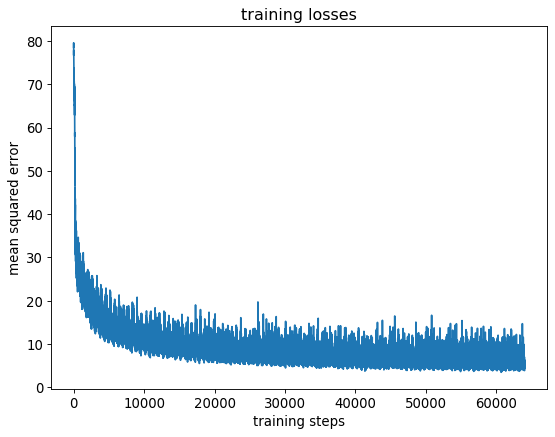

In [93]:
plt.plot(trn_losses)
plt.title("training losses")
plt.xlabel("training steps")
plt.ylabel("mean squared error")
plt.show()

In [107]:
# device = torch.device("cpu")
device = torch.device("cuda:0")

In [108]:
%%time
x_val, y_val = ch_gen.data_generator(nsamples=32, 
                              dim_x=dim_x*10, 
                              init_steps=init_steps, 
                              delta_sim_steps = delta_sim_steps,
                              dx=dx, 
                              dt=dt,
                              m_l=m_l, 
                              m_r=m_r,
                              n_step=1,
                              gamma=gamma, 
                              seed=389641,
                              device=device)


val_dataset = CahnHillDataset(x_val, y_val, transform_x=transformer_x, transform_y=transformer_y)
val_loader = DataLoader(val_dataset, batch_size=32, shuffle=True, num_workers=1)


total_val_step = len(val_loader)
print("No. of validation steps: %d" % total_val_step)

No. of validation steps: 1
CPU times: user 48.7 s, sys: 46.7 s, total: 1min 35s
Wall time: 1min 33s


In [103]:
# device = torch.device("cpu")
# # device = torch.device("cuda:0")
# model.to(device)

# prd_losses = []
# for item in val_loader:
    
#     torch.cuda.empty_cache()
#     model.eval()
    
#     x1 = item['x'].to(device)
#     y1 = item['y'].to(device)
#     # Forward pass
#     y2 = model(x1)
#     prd_losses.append(np.sqrt(criterion(y2, y1).item()))
# print(np.mean(prd_losses), np.std(prd_losses))

17.966693648133482 0.0


In [109]:
def mae_loss(x1, x2):
    return np.mean(np.fabs(x1-x2))

maerr = lambda x1, x2: np.fabs(x1-x2)
diff = lambda x1,x2: np.log(maerr(x1, x2))

mae: 0.112


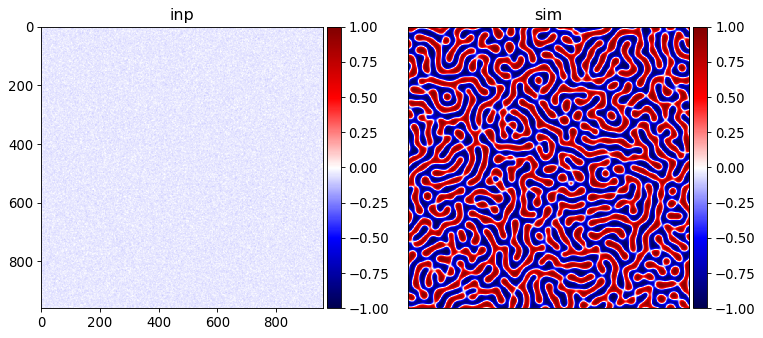

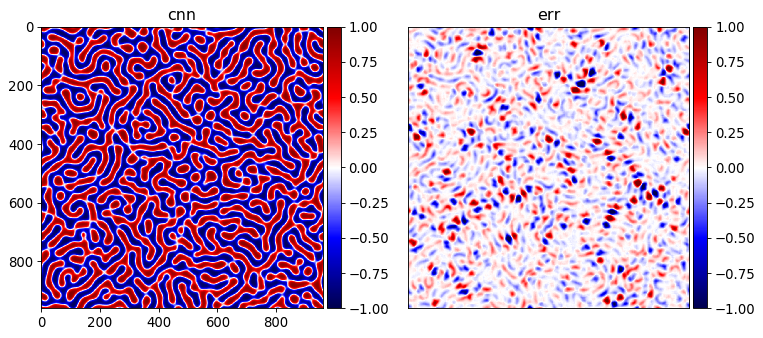

In [105]:
# device = torch.device("cpu")
# device = torch.device("cuda:0")

ix = -1

item_v = val_dataset[ix]
x1 = item_v['x'][None].to(device)
y1 = item_v['y'][None].to(device)

model.to(device)
y2 = model(x1)

im_x1 = x1[0][0].detach().cpu().numpy()
im_y1 = y1[0][0].detach().cpu().numpy()
im_y2 = y2[0][0].detach().cpu().numpy()

print("mae: {:1.3f}".format(mae_loss(im_y1, im_y2)))

ch_utils.draw_by_side([im_x1, im_y1], 
                      sub_titles=["inp", "sim"])

ch_utils.draw_by_side([im_y2, im_y1-im_y2], 
                      sub_titles=["cnn", "err"])

In [111]:
np.mean(errs)

0.09537392334233022

mae: 0.101


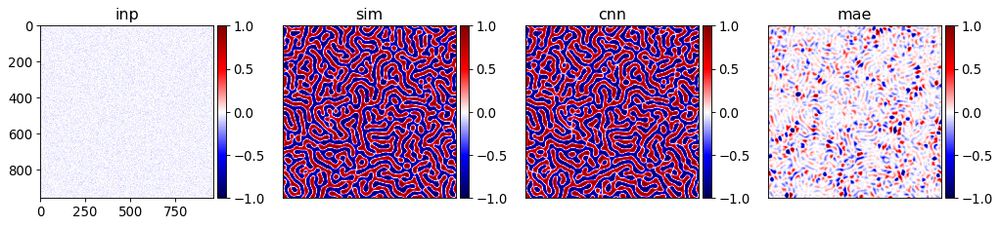

mae: 0.113


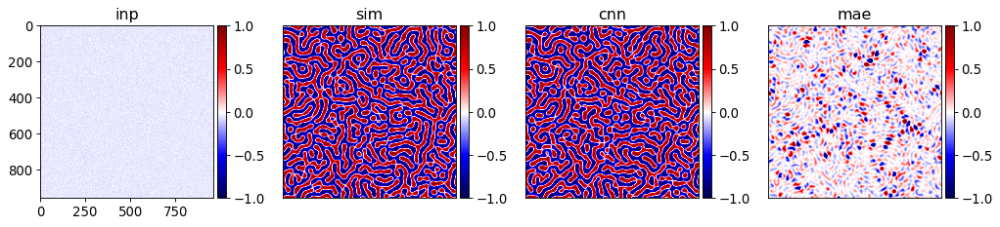

mae: 0.105


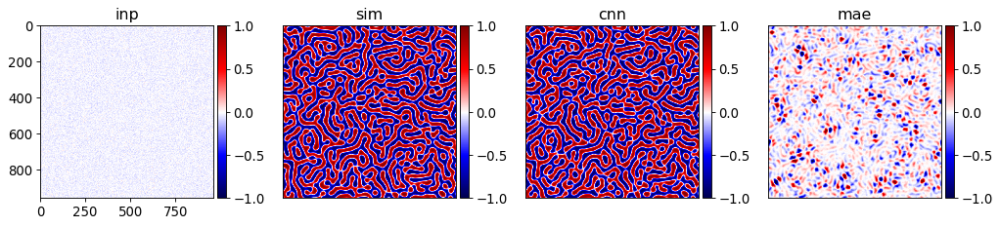

mae: 0.081


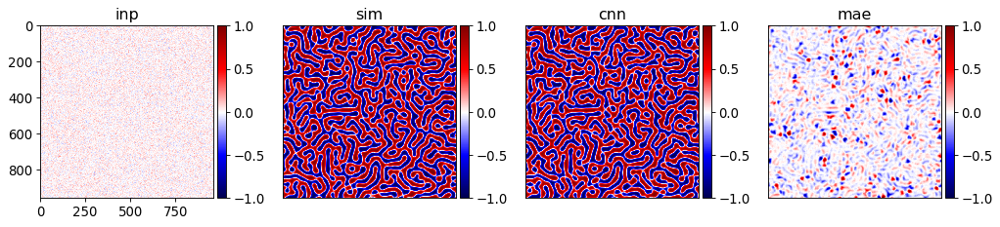

mae: 0.095


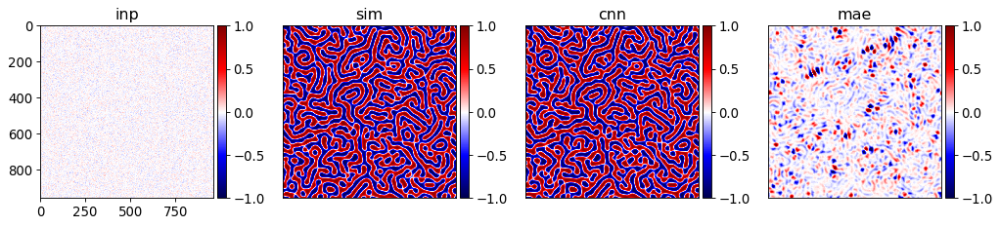

mae: 0.099


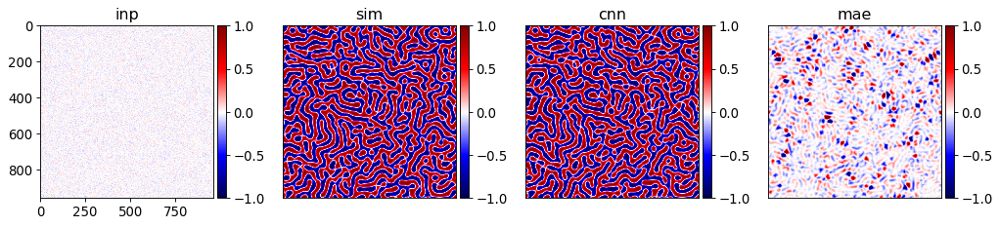

mae: 0.099


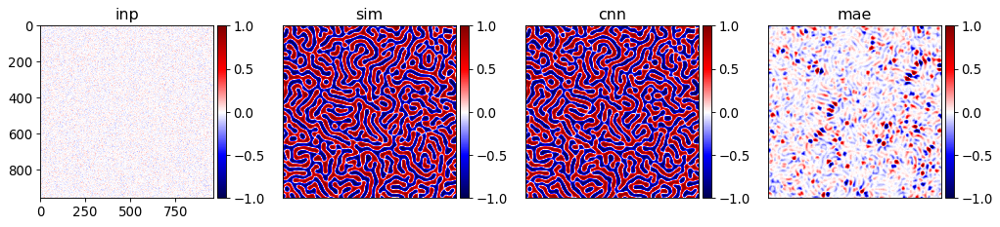

mae: 0.081


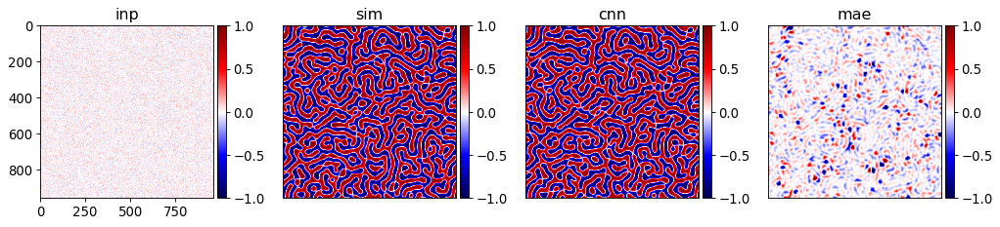

mae: 0.090


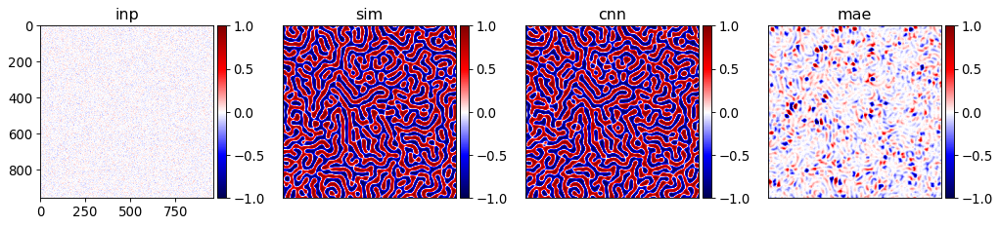

mae: 0.084


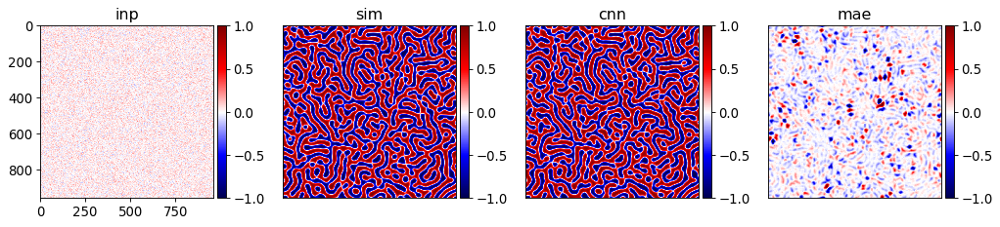

mae: 0.096


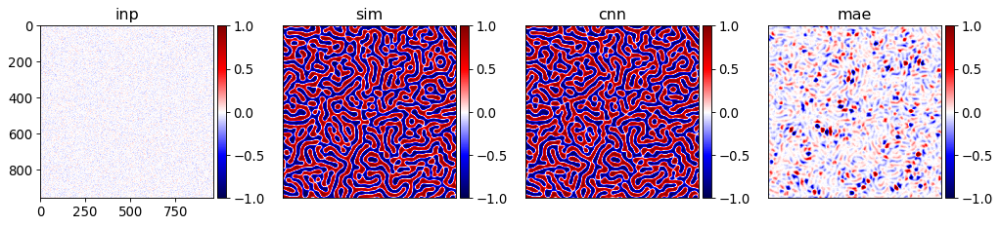

mae: 0.113


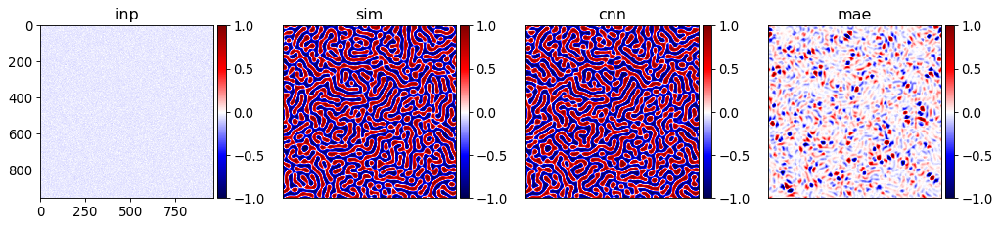

mae: 0.104


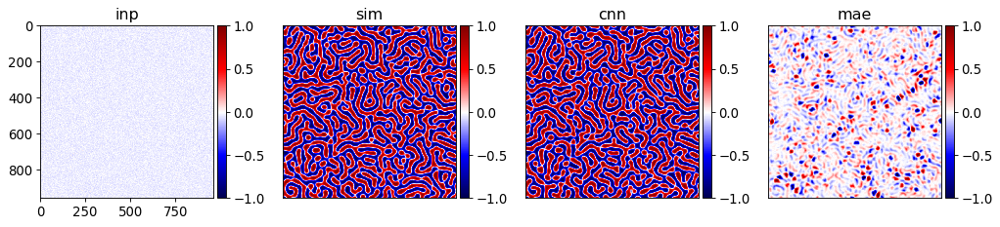

mae: 0.086


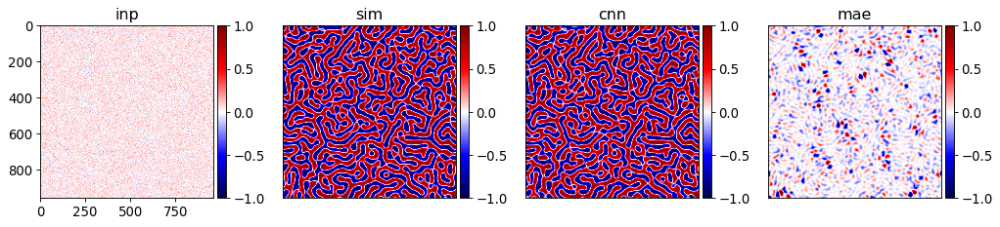

mae: 0.102


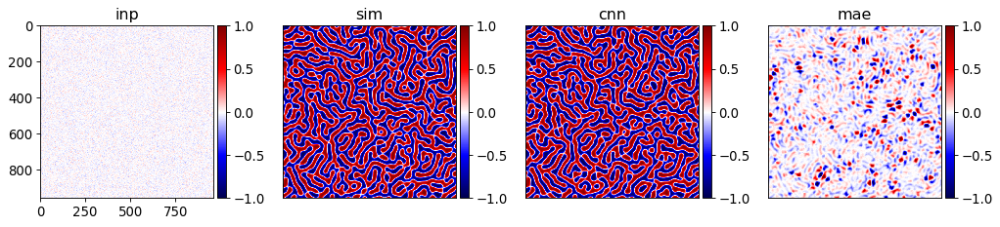

mae: 0.092


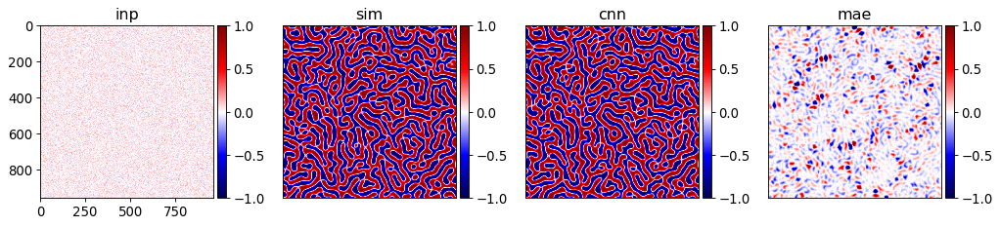

mae: 0.082


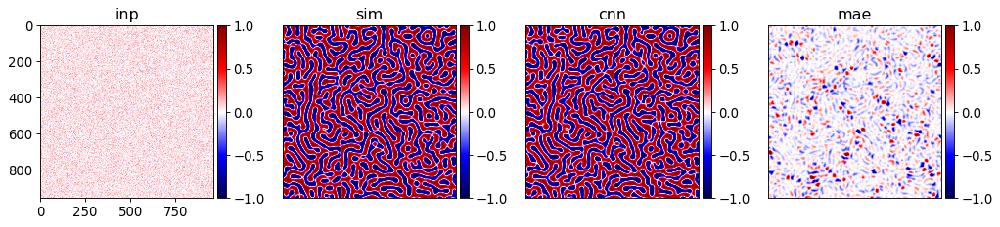

mae: 0.098


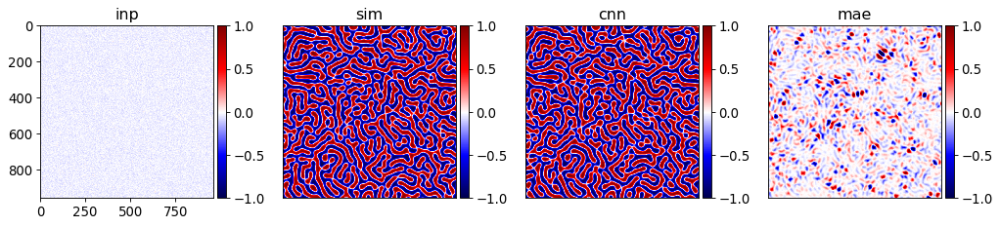

mae: 0.097


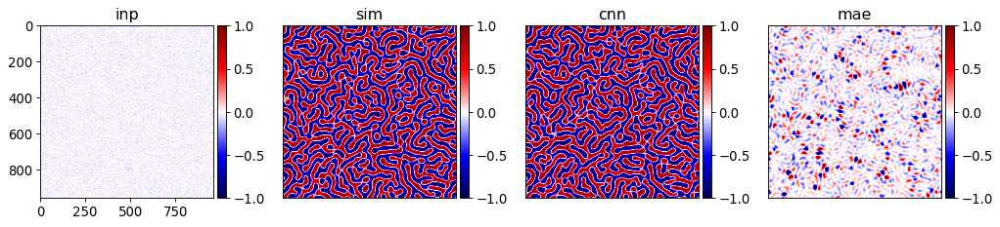

mae: 0.093


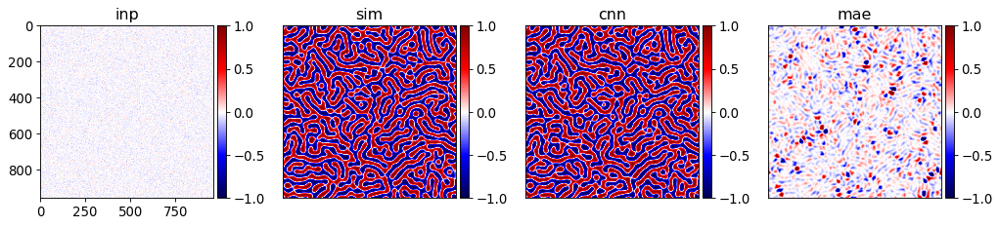

mae: 0.087


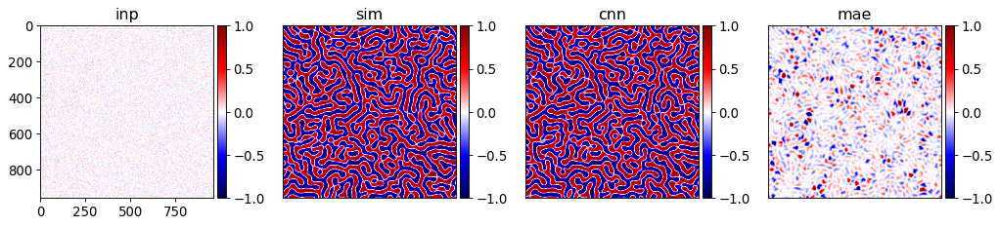

mae: 0.098


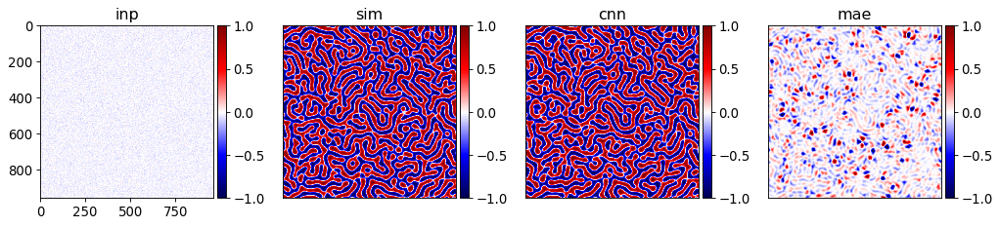

mae: 0.097


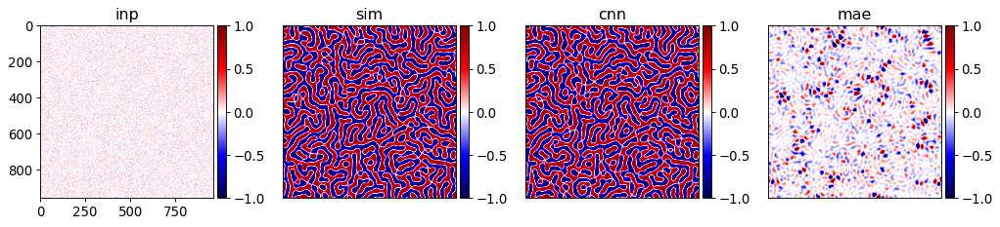

mae: 0.113


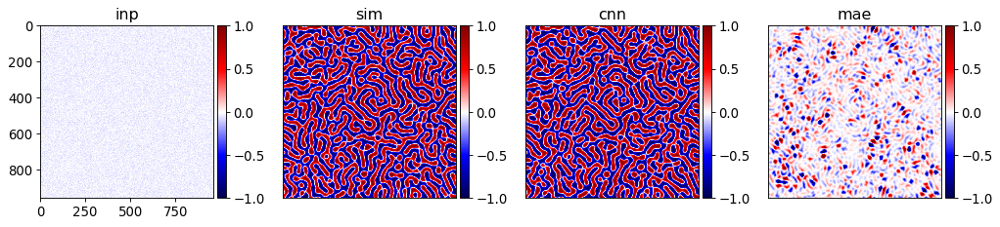

mae: 0.088


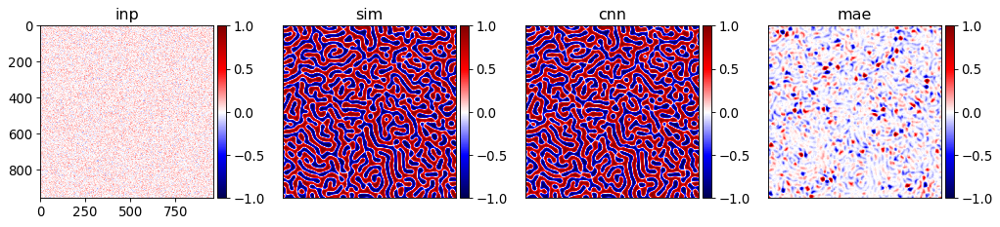

mae: 0.087


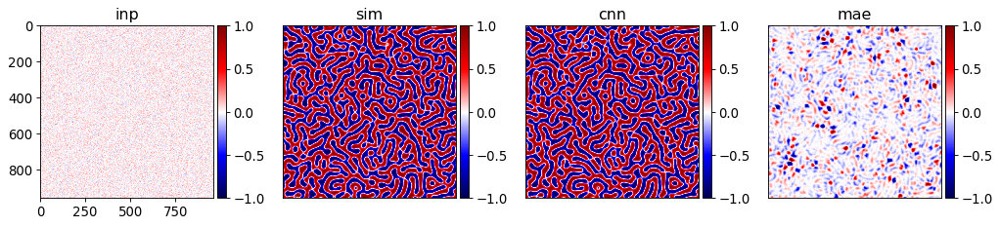

mae: 0.115


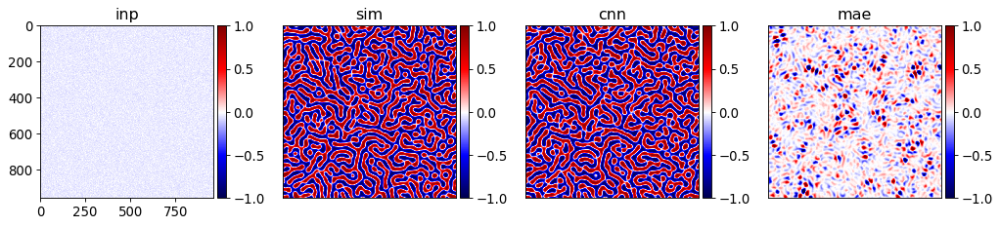

mae: 0.094


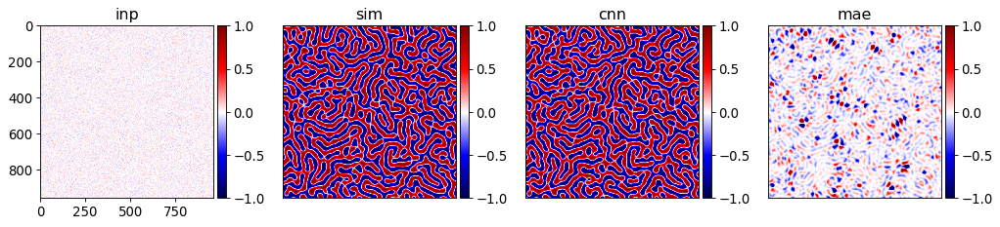

mae: 0.094


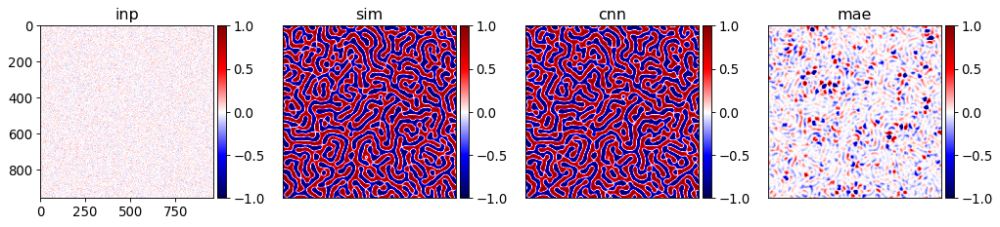

mae: 0.084


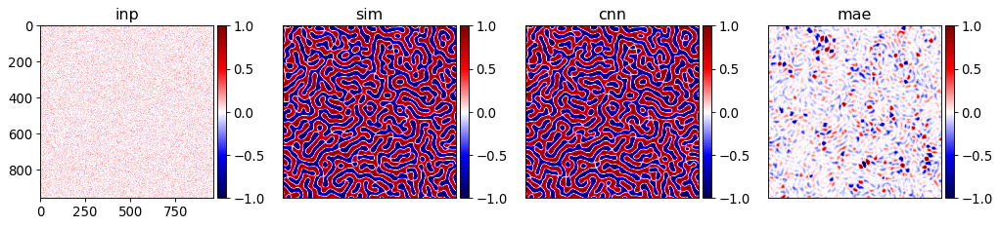

mae: 0.095


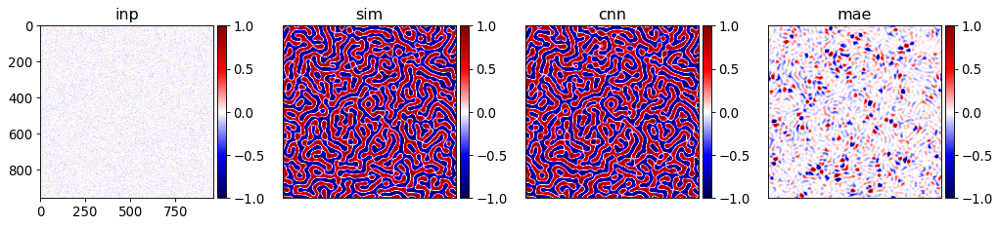

mae: 0.089


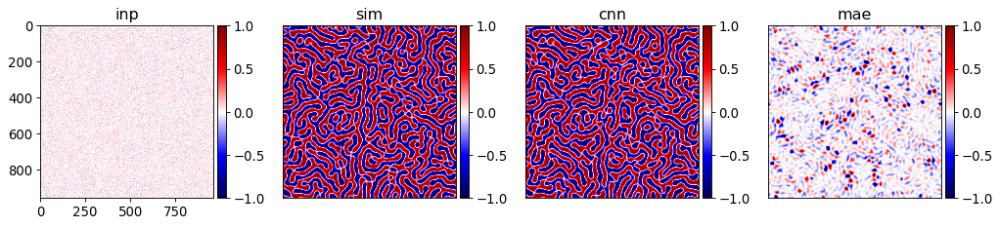

In [110]:
# device = torch.device("cpu")
# device = torch.device("cuda:0")

errs = []
for ix in range(len(val_dataset)):
    
    item_v = val_dataset[ix]
    x1 = item_v['x'][None].to(device)
    y1 = item_v['y'][None].to(device)
    
    torch.cuda.empty_cache()
    model.eval()
    model.to(device)
    y2 = model(x1)

    im_x1 = x1[0][0].detach().cpu().numpy()
    im_y1 = y1[0][0].detach().cpu().numpy()
    im_y2 = y2[0][0].detach().cpu().numpy()
    
    errs.append(mae_loss(im_y1, im_y2))
    print("mae: {:1.3f}".format(errs[-1]))
    ch_utils.draw_by_side([im_x1, im_y1, im_y2, im_y1-im_y2], 
                          sub_titles=["inp", "sim", "cnn", "mae"], scale=8)